In [ ]:
import pydicom as dicom
import os
import cv2
import pandas as pd
import math
import numpy as np
import glob
from pathlib import Path
from shutil import copyfile
from shutil import copy
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import csv

# PART 1 - CONVERT DICOM TO JPG

In [ ]:
# Config Create Images
images_to_use = 25
x_crop = 56
y_crop = 56
folder_path = "/kaggle/input/prostate-mri-us-biopsy/prostate_mri_us_biopsy/Prostate-MRI-US-Biopsy"
output_folder_path = "/kaggle/working"

In [ ]:
def process_folder(folder_path):

    """
    process_folder processes DCOM images in the folder

    :param folder_path: folder to process
    :return: jpg_list,dcm_values
    """

    jpg_list = []
    dcm_values = []

    images_path = os.listdir(folder_path)

    for image in images_path:
        full_path = os.path.join(folder_path, image)
        if image.endswith(".dcm"):
            ds = dicom.dcmread(full_path)

            jpg_image_name = output_folder_path+full_path+".jpg"
            jpg_list.append(jpg_image_name)

            if not os.path.exists(output_folder_path+folder_path):
                os.makedirs(output_folder_path+folder_path)

            cv2.imwrite(jpg_image_name, ds.pixel_array)

            patient_name=''
            patient_age=''
            patient_size=''
            patient_weight=''
            patient_eth=''
            patient_occ=''
            patient_smoke=''

            try:
                patient_name = ds[0x0010,0x0010].value
            except:
                pass

            try:
                patient_age = ds[0x0010,0x1010].value
            except:
                pass

            try:
                patient_size = ds[0x0010,0x1020].value
            except:
                pass

            try:
                patient_weight = ds[0x0010,0x1030].value
            except:
                pass

            try:
                patient_eth = ds[0x0010,0x2160].value
            except:
                pass

            try:
                patient_occ = ds[0x0010,0x2180].value
            except:
                pass

            try:
                patient_smoke = ds[0x0010,0x21a0].value
            except:
                pass

            dcm_values.append([patient_name,patient_age,patient_size,patient_weight,patient_eth,patient_occ,patient_smoke])

    return jpg_list,dcm_values,(output_folder_path+folder_path)

In [ ]:
def crop_image(folder_path,x_crop,y_crop):

    """
    crop_image crops the image

    :param folder_path: folder to process
    :param x_crop: pixel crop x
    :param y_crop: pixel crop y
    """

    fileList = glob.glob(folder_path + '*jpg*')

    # Iterate over images
    for filePath in fileList:
        img = cv2.imread(filePath)
        image_shape_x = img.shape[0]
        image_shape_y = img.shape[1]

        crop_img = img[(0+y_crop):(image_shape_y-y_crop), (0+x_crop):(image_shape_x-x_crop)]
        cv2.imwrite(filePath, crop_img)

In [ ]:
def remove_jpg(folder_path):

    """
    remove_jpg removes jpg from folder

    :param folder_path: folder to process
    """

    # ==========================================================================================
    # Remove old Final Files
    # ==========================================================================================
    fileList1  = glob.glob(folder_path + '**/*AX_T2*/*jpg*' , recursive=True)
    fileList2 = glob.glob(folder_path + '**/*PROPELLER*/*jpg*' , recursive=True)
    fileList3 = glob.glob(folder_path + '**/*axial*/*jpg*' , recursive=True)
    fileList4 = glob.glob(folder_path + '**/*T2 Ax*/*jpg*' , recursive=True)
    fileList5 = glob.glob(folder_path + '**/*AX T2*/*jpg*' , recursive=True)
    fileList6 = glob.glob(folder_path + '**/*AX */*jpg*' , recursive=True)
    fileList7 = glob.glob(folder_path + '**/*T2 AX*/*jpg*' , recursive=True)
    fileList8 = glob.glob(folder_path + '**/*T2 SPACE*/*jpg*' , recursive=True)
    fileList = fileList1 + fileList2 + fileList3 + fileList4 + fileList5 + fileList6 + fileList7 + fileList8

    # Iterate over the list of filepaths & remove each file.
    for filePath in fileList:
        try:
            os.remove(filePath)
        except:
            pass

In [ ]:
def make_patient_image(folder_path,images_to_use):

    """
    make_patient_image creates images

    :param folder_path: folder to process
    :param images_to_use: images to use
    """

    # ==========================================================================================
    # List all Images
    # ==========================================================================================
    images_path = os.listdir(folder_path)
    image_list = []

    for image in images_path:
        full_path = os.path.join(folder_path, image)
        if image.endswith(".jpg"):
            image_list.append(full_path)

    #sort images
    image_list.sort()

    image_cnt = len(image_list)

    image_ignore = math.floor((image_cnt- images_to_use)/2)

    #remove first x images
    image_list = image_list[image_ignore:]

    #remove last x images
    image_list = image_list[:len(image_list)-image_ignore]

    image_list = image_list[:images_to_use]

    image_cnt = len(image_list)

    if image_cnt == 25:
        dims = 5
    elif image_cnt == 16:
        dims = 4
    elif image_cnt == 4:
        dims = 2
    elif image_cnt < 4:
        dims = 1
    else:
        dims = math.ceil((math.sqrt(image_cnt)))

    # ==========================================================================================
    # Looping Over Images to Concatenate and create Vertical
    # ==========================================================================================
    for coll_cnt in range(0,dims):

        final_image = os.path.join(folder_path, "finalV" + str(coll_cnt)+".jpg")
        zero_flag = 0

        #print("======================================")

        for x in range(1,(dims)):

            image_number = (x - 1) + (coll_cnt * dims)

            if image_number >= (image_cnt-1):
                # set image file names
                img1 = final_image
                img2 = image_list[(0)]

            elif zero_flag == 0:
                # set image file names
                img1 = image_list[image_number]
                img2 = image_list[(image_number+1)]
                zero_flag = 1
            else:
                # set image file names
                img1 = final_image
                img2 = image_list[(image_number+1)]

            # read the images
            img1 = cv2.imread(img1)
            img2 = cv2.imread(img2)

            try:
                im_v = cv2.vconcat([img1, img2])
                cv2.imwrite(final_image, im_v)
            except:
                pass

    # ==========================================================================================
    # Looping Over finalV images to concatenate into final image
    # ==========================================================================================

    final_image = os.path.join(folder_path, "final.jpg")
    image_list = glob.glob(folder_path + '*final*')
    image_cnt = len(image_list) - 1
    zero_flag = 0
    image_list.sort()

    for x in range(0,image_cnt):

        if zero_flag == 0:
            # set image file names
            img1 = image_list[x]
            img2 = image_list[(x+1)]
            zero_flag = 1
        else:
            # set image file names
            img1 = final_image
            img2 = image_list[(x+1)]

        # read the images
        img1 = cv2.imread(img1)
        img2 = cv2.imread(img2)

        im_v = cv2.hconcat([img1, img2])
        cv2.imwrite(final_image, im_v)

In [ ]:
#fileList = glob.glob(folder_path + '*/*0001*/*/*obl*' , recursive=True)
fileList = glob.glob(folder_path + '*/*/*/*obl*' , recursive=True)
dcm_metadata = []

print(len(fileList))
counter = 0

# Remove all JPG
remove_jpg(output_folder_path)

# Sort List
fileList.sort()

for folder in tqdm(fileList,desc = 'Progress Bar: Processing'  ):

    # Convert dicom to JPEG
    jpg_list, dcm_values, output_folder = process_folder(folder+"/")

    # Append Metadata to FinalList
    dcm_metadata.append(dcm_values)

    # Crop Image
    crop_image(output_folder+"/",x_crop,y_crop)

    # Make collage
    make_patient_image(output_folder+"/",images_to_use)

    counter = counter + 1

832


Progress Bar: Processing: 100%|██████████| 832/832 [07:05<00:00,  1.95it/s]


In [ ]:
# Create Empty DataFrame
df = pd.DataFrame(columns=['name','age','size','weight','ethnic_grp','occupation','smoking_status'])

# Get Patient List
counter = 0
for entry in dcm_metadata:
    df.loc[counter] = [entry[0][0]] + [entry[0][1]] + [entry[0][2]] + [entry[0][3]] + [entry[0][4]] + [entry[0][5]] + [entry[0][6]]
    counter = counter + 1

df.to_csv("patients.csv", sep=',', encoding='utf-8', index=False)

# PART 2 CREATE POS/NEG DATASET

In [ ]:
# Config Create Dataset
# Destinations Folders
pso_folder = "/kaggle/working/dataset/src/pos"
neg_folder = "/kaggle/working/dataset/src/neg"

#Target Flags
labels_file = "/kaggle/input/prostate-mri-us-biopsy/TCIA Biopsy Data_2020-07-14.xlsx"

#Source Images Path
folder_path = "/kaggle/working/kaggle/input/prostate-mri-us-biopsy/prostate_mri_us_biopsy/Prostate-MRI-US-Biopsy"
file_name = "final.jpg"

In [ ]:
if not os.path.exists(pso_folder):
    os.makedirs(pso_folder)

if not os.path.exists(neg_folder):
    os.makedirs(neg_folder)

In [ ]:
def get_labels(patient_id):
    df = labels_df[labels_df['Patient Number'].str.contains(patient_id)]

    df = df[df["% Cancer in Core"] > 0]

    if len(df) > 0:
        return 1
    else:
        return 0

In [ ]:
def move_image(file_name,image,patient_id,scan_date):
    new_image_name = file_name +"_"+ scan_date +"_"+ patient_id +".jpg"

    if get_labels(patient_id) == 1:
        dst_folder = pso_folder
    else:
        dst_folder = neg_folder

    final_image = os.path.join(dst_folder, new_image_name)

    copyfile(image, final_image)

In [ ]:
# ==========================================================================================
# Remove old Final Files
# ==========================================================================================
fileList = glob.glob(pso_folder+"/" + '*jpg*')

# Iterate over the list of filepaths & remove each file.
for filePath in fileList:
    try:
        os.remove(filePath)
    except:
        print("Error while deleting file : ", filePath)

fileList = glob.glob(neg_folder+"/" + '*jpg*')

# Iterate over the list of filepaths & remove each file.
for filePath in fileList:
    try:
        os.remove(filePath)
    except:
        print("Error while deleting file : ", filePath)

In [ ]:
labels_df = pd.read_excel (labels_file)
fileList = glob.glob(folder_path + '**/*/*/*/'+file_name   , recursive=True)
#print(fileList[0:2])

for image in tqdm(fileList,desc = 'Progress Bar: Processing'  ):

    patient_id = image[121:125]
    scan_date = image[126:136]

#    print(image)
#    print(patient_id)
#    print(scan_date)

    move_image(file_name,image,patient_id,scan_date)

Progress Bar: Processing:   0%|          | 0/831 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/pandas/core/computation/expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)
Progress Bar: Processing: 100%|██████████| 831/831 [00:06<00:00, 124.65it/s]


In [ ]:
fileList = glob.glob(pso_folder + '**/*'  , recursive=True)
print(len(fileList))


fileList = glob.glob(neg_folder + '**/*'  , recursive=True)
print(len(fileList))

675
156


# PART 3 - TEST/TRAIN SPLIT

In [ ]:
test_size = 0.4
val_size = 0.5
seed = 0

#Train
train_pos = "/kaggle/working/dataset/ds1/train/pos/"
train_neg = "/kaggle/working/dataset/ds1/train/neg/"

#Test
test_pos =  "/kaggle/working/dataset/ds1/test/pos/"
test_neg =  "/kaggle/working/dataset/ds1/test/neg/"

#Val
val_neg = "/kaggle/working/dataset/ds1/val/neg/"
val_pos = "/kaggle/working/dataset/ds1/val/pos/"

#File Prefix
file_prefix = 'final'

In [ ]:
if not os.path.exists(train_pos):
    os.makedirs(train_pos)

if not os.path.exists(train_neg):
    os.makedirs(train_neg)

if not os.path.exists(test_pos):
    os.makedirs(test_pos)

if not os.path.exists(test_neg):
    os.makedirs(test_neg)

if not os.path.exists(val_neg):
    os.makedirs(val_neg)

if not os.path.exists(val_pos):
    os.makedirs(val_pos)


In [ ]:
def clean_folder(folder,file_prefix):

    """
    clean_folder removes files with file_prefix

    :param folder_path: folder to process
    :param file_prefix: file prefix
    """

    fileList = glob.glob(folder + '*'+ file_prefix + '*')
    for filePath in fileList:
        try:
            os.remove(filePath)
        except:
            print("Error while deleting file : ", filePath)

In [ ]:
def make_test_train(f1,f2,f3,f4,seed,file_prefix,file_loc_list):

    """
    make_test_train processes DCOM images in the folder

    :param f1: folder to process
    :param f2: folder to process
    :param f3: folder to process
    :param f4: folder to process
    :param seed: random seed
    :param file_prefix: file prefix
    :param file_loc_list: file location list
    :return: file_loc_list
    """

    fileList = glob.glob(f3 + '**/*' + file_prefix +'*' , recursive=True)
    data = np.array(fileList)
    x_train ,x_test = train_test_split(data,test_size=test_size,random_state=seed)

    x_test,x_val    = train_test_split(x_test,test_size=val_size,random_state=seed)

    for file in x_train:
        file_loc_list.append(["train",file])
        copy(str(file), f1)

    for file in x_test:
        file_loc_list.append(["test",file])
        copy(str(file), f2)

    for file in x_val:
        file_loc_list.append(["val",file])
        copy(str(file), f4)

    return file_loc_list

In [ ]:
clean_folder(train_pos,file_prefix)
clean_folder(test_pos,file_prefix)
clean_folder(val_pos,file_prefix)

clean_folder(train_neg,file_prefix)
clean_folder(test_neg,file_prefix)
clean_folder(val_neg,file_prefix)

In [ ]:
file_loc_list = []

file_loc_list = make_test_train(train_pos,test_pos,pso_folder,val_pos,seed,file_prefix,file_loc_list)
file_loc_list = make_test_train(train_neg,test_neg,neg_folder,val_neg,seed,file_prefix,file_loc_list)

In [ ]:
file_loc_list

# Create Empty DataFrame
df = pd.DataFrame(columns=['s1','s2','s3'])
counter = 0
for entry in file_loc_list:
    df.loc[counter] = [entry[0]] + [entry[1]] + [entry[1][42:46]]
    counter = counter + 1

df.to_csv("train_test_val.csv", sep=',', encoding='utf-8', index=False)

# PART 4 - TRAIN DNN MODEL

Using device: cuda


<ipython-input-33-8397fbcc203c>:67: DeprecationWarning: Flip is deprecated. Consider using HorizontalFlip, VerticalFlip, RandomRotate90 or D4.
  A.Flip(),
<ipython-input-33-8397fbcc203c>:71: UserWarning: Argument 'alpha_affine' is not valid and will be ignored.
  A.ElasticTransform(alpha=1, sigma=50, alpha_affine=50, p=0.5),


----- Epoch 1/100 -----


<ipython-input-33-8397fbcc203c>:124: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()
<ipython-input-33-8397fbcc203c>:139: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:224: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(


Epoch 1 Batch 0/32 Loss: 2.1426
Epoch 1 Batch 10/32 Loss: 1.1426
Epoch 1 Batch 20/32 Loss: 1.8949
Epoch 1 Batch 30/32 Loss: 2.6525
Epoch 1 Training Loss: 2.2852, Accuracy: 67.47%, Time: 27.38s


<ipython-input-33-8397fbcc203c>:169: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 1 Validation Loss: 1.7253, Accuracy: 73.65%, Time: 3.16s
Epoch 1: Saved Best Model with Accuracy: 73.65%
----- Epoch 2/100 -----
Epoch 2 Batch 0/32 Loss: 0.7629
Epoch 2 Batch 10/32 Loss: 3.6890
Epoch 2 Batch 20/32 Loss: 1.3049
Epoch 2 Batch 30/32 Loss: 1.5236
Epoch 2 Training Loss: 1.8300, Accuracy: 73.90%, Time: 27.39s
Epoch 2 Validation Loss: 1.4226, Accuracy: 71.26%, Time: 3.15s
----- Epoch 3/100 -----
Epoch 3 Batch 0/32 Loss: 0.8932
Epoch 3 Batch 10/32 Loss: 0.9547
Epoch 3 Batch 20/32 Loss: 1.2546
Epoch 3 Batch 30/32 Loss: 1.2498
Epoch 3 Training Loss: 1.5028, Accuracy: 74.30%, Time: 26.93s
Epoch 3 Validation Loss: 1.7564, Accuracy: 78.44%, Time: 3.20s
Epoch 3: Saved Best Model with Accuracy: 78.44%
----- Epoch 4/100 -----
Epoch 4 Batch 0/32 Loss: 0.6650
Epoch 4 Batch 10/32 Loss: 0.7077
Epoch 4 Batch 20/32 Loss: 0.5353
Epoch 4 Batch 30/32 Loss: 1.7185
Epoch 4 Training Loss: 1.0630, Accuracy: 78.11%, Time: 26.99s
Epoch 4 Validation Loss: 2.0358, Accuracy: 79.64%, Time: 3.19s
E

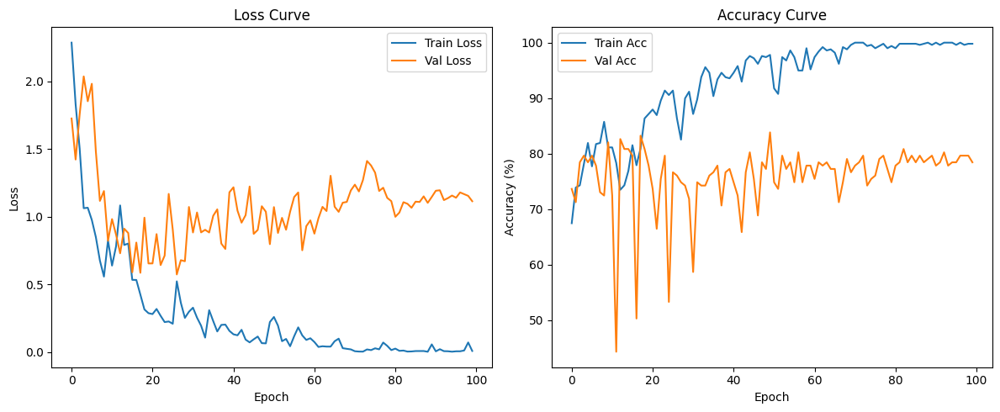

<ipython-input-33-8397fbcc203c>:239: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location=device)


Model exported to ONNX format at best_model.onnx


In [ ]:
"""
Advanced Prostate Cancer Image Classification Training Script with ONNX Export

Techniques included:
•   Pretrained EfficientNetV2 (from timm) – state‐of‐the‐art for image classification.
•   Albumentations-based advanced augmentation (flip, rotate, distortions, etc.).
•   Mixed precision training (AMP) for faster training.
•   OneCycleLR learning rate scheduler for rapid convergence.
•   Export of the best model to ONNX for efficient inference deployment.

GPU Recommendation:
•   If given a choice, the Tesla P100 generally outperforms a pair of T4 GPUs in deep learning training due to its higher raw compute power.
"""

import os
import time
import random
import shutil
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
import torch.backends.cudnn as cudnn
from torch.cuda.amp import GradScaler, autocast
from torch.utils.data import Dataset, DataLoader
from torchvision import datasets
import timm

# Advanced augmentation library
import albumentations as A
from albumentations.pytorch import ToTensorV2

# -----------------------
# Set random seeds for reproducibility
# -----------------------
SEED = 1
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
cudnn.deterministic = True
cudnn.benchmark = True

# -----------------------
# Global parameters and paths
# -----------------------
NUM_CLASSES    = 2
EPOCHS         = 100       # Adjust according to your GPU time and convergence behavior
BATCH_SIZE     = 16        # Adjust based on available memory
IMG_SIZE       = 512       # You can experiment with 512 or 700; higher resolutions need more memory
LEARNING_RATE  = 1e-3
WEIGHT_DECAY   = 1e-4

TRAIN_DIR = "/kaggle/working/dataset/ds1/train/"
VAL_DIR   = "/kaggle/working/dataset/ds1/val/"

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
print("Using device:", DEVICE)

# -----------------------
# Data Augmentation using Albumentations
# -----------------------
train_transform = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
    A.RandomRotate90(),
    A.Flip(),
    A.Transpose(),
    A.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.1, rotate_limit=15, p=0.7),
    A.OneOf([
         A.ElasticTransform(alpha=1, sigma=50, alpha_affine=50, p=0.5),
         A.GridDistortion(p=0.5),
         A.OpticalDistortion(p=0.5)
    ], p=0.3),
    A.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
])

val_transform = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
    A.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
])

# -----------------------
# Custom Dataset using Albumentations
# -----------------------
class ProstateDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.dataset = datasets.ImageFolder(root=root_dir)
        self.transform = transform

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        img, label = self.dataset[idx]
        img = np.array(img)  # Convert PIL image to numpy array
        if self.transform:
            augmented = self.transform(image=img)
            img = augmented['image']
        return img, label

train_dataset = ProstateDataset(TRAIN_DIR, transform=train_transform)
val_dataset   = ProstateDataset(VAL_DIR, transform=val_transform)

train_loader  = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, pin_memory=True)
val_loader    = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4, pin_memory=True)

# -----------------------
# Model Definition
# -----------------------
MODEL_NAME = "tf_efficientnetv2_m"  # You can experiment with other models as needed.
model = timm.create_model(MODEL_NAME, pretrained=True, num_classes=NUM_CLASSES)
model = model.to(DEVICE)

criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=LEARNING_RATE,
                                                steps_per_epoch=len(train_loader),
                                                epochs=EPOCHS)
scaler = GradScaler()

# -----------------------
# Training and Validation Functions
# -----------------------
def train_one_epoch(epoch):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    start_time = time.time()

    for batch_idx, (inputs, targets) in enumerate(train_loader):
        inputs, targets = inputs.to(DEVICE), targets.to(DEVICE)
        optimizer.zero_grad()
        with autocast():
            outputs = model(inputs)
            loss = criterion(outputs, targets)
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        scheduler.step()

        running_loss += loss.item()
        _, predicted = outputs.max(1)
        total += targets.size(0)
        correct += predicted.eq(targets).sum().item()

        if batch_idx % 10 == 0:
            print(f"Epoch {epoch} Batch {batch_idx}/{len(train_loader)} Loss: {loss.item():.4f}")

    epoch_loss = running_loss / len(train_loader)
    epoch_acc  = 100. * correct / total
    print(f"Epoch {epoch} Training Loss: {epoch_loss:.4f}, Accuracy: {epoch_acc:.2f}%, Time: {time.time()-start_time:.2f}s")
    return epoch_loss, epoch_acc

def validate_model(epoch):
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    start_time = time.time()
    with torch.no_grad():
        for batch_idx, (inputs, targets) in enumerate(val_loader):
            inputs, targets = inputs.to(DEVICE), targets.to(DEVICE)
            with autocast():
                outputs = model(inputs)
                loss = criterion(outputs, targets)
            running_loss += loss.item()
            _, predicted = outputs.max(1)
            total += targets.size(0)
            correct += predicted.eq(targets).sum().item()

    epoch_loss = running_loss / len(val_loader)
    epoch_acc  = 100. * correct / total
    print(f"Epoch {epoch} Validation Loss: {epoch_loss:.4f}, Accuracy: {epoch_acc:.2f}%, Time: {time.time()-start_time:.2f}s")
    return epoch_loss, epoch_acc

# -----------------------
# Training Loop and Best Model Checkpointing
# -----------------------
best_val_acc = 0.0
train_losses, train_accuracies = [], []
val_losses, val_accuracies = [], []

for epoch in range(1, EPOCHS+1):
    print(f"----- Epoch {epoch}/{EPOCHS} -----")
    train_loss, train_acc = train_one_epoch(epoch)
    val_loss, val_acc     = validate_model(epoch)

    train_losses.append(train_loss)
    train_accuracies.append(train_acc)
    val_losses.append(val_loss)
    val_accuracies.append(val_acc)

    # Save checkpoint if best accuracy so far
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        checkpoint = {
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'val_acc': best_val_acc,
        }
        torch.save(checkpoint, 'best_model.pth')
        print(f"Epoch {epoch}: Saved Best Model with Accuracy: {best_val_acc:.2f}%")

# -----------------------
# Plot learning curves (optional)
# -----------------------
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Val Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Loss Curve")
plt.legend()

plt.subplot(1,2,2)
plt.plot(train_accuracies, label="Train Acc")
plt.plot(val_accuracies, label="Val Acc")
plt.xlabel("Epoch")
plt.ylabel("Accuracy (%)")
plt.title("Accuracy Curve")
plt.legend()
plt.tight_layout()
plt.savefig("training_curves.png")
plt.show()

# -----------------------
# Export Best Model to ONNX Format
# -----------------------
def export_model_to_onnx(model, checkpoint_path, onnx_path, device, img_size):
    # Load the best checkpoint
    checkpoint = torch.load(checkpoint_path, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.eval()

    # Create a dummy input tensor with the appropriate dimensions
    dummy_input = torch.randn(1, 3, img_size, img_size, device=device)

    # Export the model to ONNX
    torch.onnx.export(model, dummy_input, onnx_path,
                      export_params=True,
                      opset_version=12,
                      do_constant_folding=True,
                      input_names=['input'],
                      output_names=['output'],
                      dynamic_axes={'input': {0: 'batch_size'},
                                    'output': {0: 'batch_size'}})
    print(f"Model exported to ONNX format at {onnx_path}")

onnx_filename = "best_model.onnx"
export_model_to_onnx(model, 'best_model.pth', onnx_filename, DEVICE, IMG_SIZE)

# -----------------------
# Inference Function for a Single Image (using PyTorch model)
# -----------------------
def predict_image(image_path, model, transform, device):
    from PIL import Image
    image = np.array(Image.open(image_path).convert('RGB'))
    augmented = transform(image=image)
    input_tensor = augmented['image'].unsqueeze(0).to(device)
    model.eval()
    with torch.no_grad():
        with autocast():
            output = model(input_tensor)
            probs = torch.softmax(output, dim=1)
            conf, pred = torch.max(probs, 1)
    return pred.item(), conf.item()

# Example usage:
# pred_class, confidence = predict_image("path/to/image.jpg", model, val_transform, DEVICE)
# print("Predicted Class:", pred_class, "Confidence:", confidence)


In [ ]:
# ========================
# ENHANCED PROSTATE CANCER CLASSIFICATION
# Research-Grade Training & Evaluation Pipeline
# ========================
!pip install onnxruntime
import os
import time
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (classification_report, confusion_matrix,
                             accuracy_score, roc_curve, auc,
                             precision_recall_curve, average_precision_score)
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
from torchvision import transforms, datasets
from torch.utils.data import DataLoader
from torch.cuda.amp import GradScaler, autocast
import timm
import onnx
import onnxruntime as ort
from tqdm import tqdm

# ========================
# ADVANCED CONFIGURATION
# ========================
class Config:
    SEED = 42
    NUM_CLASSES = 2
    IMG_SIZE = 512
    BATCH_SIZE = 16
    EPOCHS = 50
    LR = 2e-4
    WEIGHT_DECAY = 1e-4
    EARLY_STOP_PATIENCE = 5
    MODEL_SAVE_FORMAT = 'pt'  # Changed to .pt for PyTorch
    MODELS = [
        'resnet50',
        'efficientnet_b3',
        'densenet201',
        'convnext_small'
    ]
    DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    WORKERS = 8 if torch.cuda.is_available() else 4
    TRAIN_DIR = "/kaggle/working/dataset/ds1/train/"
    VAL_DIR = "/kaggle/working/dataset/ds1/val/"
    METRIC_SAVE_PATH = "/kaggle/working/results/"
    PLOT_DPI = 300

# Initialize configuration
config = Config()

# ========================
# REPRODUCIBILITY
# ========================
def seed_everything(seed):
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything(config.SEED)

# ========================
# ADVANCED DATA AUGMENTATION
# ========================
class AdvancedAugment:
    def __init__(self, img_size):
        self.train = transforms.Compose([
            transforms.Resize((img_size, img_size)),
            transforms.RandomAffine(degrees=10, translate=(0.15, 0.15)),
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.RandomVerticalFlip(p=0.5),
            transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3),
            transforms.GaussianBlur(kernel_size=(3, 7), sigma=(0.1, 3.0)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
            transforms.RandomErasing(p=0.2)
        ])

        self.val = transforms.Compose([
            transforms.Resize((img_size, img_size)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

augmenter = AdvancedAugment(config.IMG_SIZE)

# ========================
# DATA LOADERS WITH CACHING
# ========================
def create_datasets():
    train_ds = datasets.ImageFolder(
        config.TRAIN_DIR,
        transform=augmenter.train
    )
    val_ds = datasets.ImageFolder(
        config.VAL_DIR,
        transform=augmenter.val
    )
    return train_ds, val_ds

train_dataset, val_dataset = create_datasets()

train_loader = DataLoader(
    train_dataset, batch_size=config.BATCH_SIZE, shuffle=True,
    num_workers=config.WORKERS, pin_memory=True, persistent_workers=True
)

val_loader = DataLoader(
    val_dataset, batch_size=config.BATCH_SIZE, shuffle=False,
    num_workers=config.WORKERS, pin_memory=True, persistent_workers=True
)

# ========================
# RESEARCH-GRADE MODEL TRAINER
# ========================
class ResearchTrainer:
    def __init__(self, model_name, num_classes, device):
        self.model_name = model_name
        self.device = device
        self.model = self._create_model(num_classes)
        self.optimizer = optim.AdamW(
            self.model.parameters(),
            lr=config.LR,
            weight_decay=config.WEIGHT_DECAY
        )
        self.scheduler = optim.lr_scheduler.ReduceLROnPlateau(
            self.optimizer, 'max', patience=2, factor=0.5, verbose=True
        )
        self.scaler = GradScaler()
        self.criterion = nn.CrossEntropyLoss()
        self.best_metrics = {'accuracy': 0.0, 'auc': 0.0}
        self.history = {
            'train_loss': [], 'val_loss': [],
            'train_acc': [], 'val_acc': [],
            'lr': [], 'val_auc': []
        }

    def _create_model(self, num_classes):
        model = timm.create_model(
            self.model_name,
            pretrained=True,
            num_classes=num_classes
        )
        if torch.cuda.device_count() > 1:
            model = nn.DataParallel(model)
        return model.to(self.device)

    def train_epoch(self, loader):
        self.model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        pbar = tqdm(loader, desc=f"Training {self.model_name}", leave=False)
        for images, labels in pbar:
            images, labels = images.to(self.device), labels.to(self.device)

            with autocast():
                outputs = self.model(images)
                loss = self.criterion(outputs, labels)

            self.scaler.scale(loss).backward()
            torch.nn.utils.clip_grad_norm_(self.model.parameters(), 1.0)
            self.scaler.step(self.optimizer)
            self.scaler.update()
            self.optimizer.zero_grad()

            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()
            running_loss += loss.item()

            pbar.set_postfix(loss=loss.item())

        return running_loss/len(loader), 100.*correct/total

    def validate(self, loader):
        self.model.eval()
        running_loss = 0.0
        all_probs = []
        all_labels = []

        with torch.no_grad():
            pbar = tqdm(loader, desc=f"Validating {self.model_name}", leave=False)
            for images, labels in pbar:
                images = images.to(self.device)
                labels = labels.to(self.device)

                with autocast():
                    outputs = self.model(images)
                    loss = self.criterion(outputs, labels)

                probs = torch.softmax(outputs, dim=1)
                all_probs.append(probs.cpu().numpy())
                all_labels.append(labels.cpu().numpy())
                running_loss += loss.item()

        all_probs = np.concatenate(all_probs)
        all_labels = np.concatenate(all_labels)
        val_loss = running_loss / len(loader)
        val_acc = 100.*accuracy_score(all_labels, np.argmax(all_probs, axis=1))
        fpr, tpr, _ = roc_curve(all_labels, all_probs[:, 1])
        roc_auc = auc(fpr, tpr)
        return val_loss, val_acc, roc_auc, fpr, tpr, all_probs, all_labels

    def save_model(self, path):
        torch.save(self.model.state_dict(), path)

    def export_onnx(self, path):
        dummy_input = torch.randn(1, 3, config.IMG_SIZE, config.IMG_SIZE).to(self.device)
        model_to_export = self.model.module if isinstance(self.model, nn.DataParallel) else self.model
        torch.onnx.export(
            model_to_export, dummy_input, path,
            export_params=True, opset_version=13,
            input_names=['input'], output_names=['output'],
            dynamic_axes={'input': {0: 'batch_size'}, 'output': {0: 'batch_size'}}
        )

# ========================
# ADVANCED TRAINING LOOP
# ========================
def train_model(model_name):
    print(f"\n{'='*40}")
    print(f"Training {model_name}")
    print(f"{'='*40}")

    trainer = ResearchTrainer(model_name, config.NUM_CLASSES, config.DEVICE)
    best_auc = 0.0
    early_stop_counter = 0

    for epoch in range(config.EPOCHS):
        start_time = time.time()

        # Train & Validate
        train_loss, train_acc = trainer.train_epoch(train_loader)
        val_loss, val_acc, val_auc, fpr, tpr, probs, labels = trainer.validate(val_loader)

        # Update learning rate
        trainer.scheduler.step(val_auc)

        # Update history
        trainer.history['train_loss'].append(train_loss)
        trainer.history['val_loss'].append(val_loss)
        trainer.history['train_acc'].append(train_acc)
        trainer.history['val_acc'].append(val_acc)
        trainer.history['val_auc'].append(val_auc)
        trainer.history['lr'].append(trainer.optimizer.param_groups[0]['lr'])

        # Save best model
        if val_auc > best_auc:
            best_auc = val_auc
            trainer.save_model(f"best_{model_name}.{config.MODEL_SAVE_FORMAT}")
            trainer.export_onnx(f"best_{model_name}.onnx")
            early_stop_counter = 0
        else:
            early_stop_counter += 1

        # Early stopping
        if early_stop_counter >= config.EARLY_STOP_PATIENCE:
            print(f"Early stopping at epoch {epoch+1}")
            break

        # Epoch summary
        print(f"Epoch {epoch+1}/{config.EPOCHS} | Time: {time.time()-start_time:.1f}s")
        print(f"Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")
        print(f"Train Acc: {train_acc:.2f}% | Val Acc: {val_acc:.2f}%")
        print(f"Val AUC: {val_auc:.4f} | Best AUC: {best_auc:.4f}\n")

    return trainer.history, (fpr, tpr, val_auc, probs, labels)

# ========================
# COMPREHENSIVE VISUALIZATION
# ========================
def visualize_results(history, model_name, roc_data):
    # Training dynamics
    plt.figure(figsize=(18, 6))
    plt.suptitle(f"{model_name} Analysis", y=1.02)

    # Loss and Accuracy
    plt.subplot(1, 3, 1)
    plt.plot(history['train_loss'], label='Train Loss')
    plt.plot(history['val_loss'], label='Val Loss')
    plt.title('Loss Curves')
    plt.xlabel('Epoch')
    plt.legend()

    plt.subplot(1, 3, 2)
    plt.plot(history['train_acc'], label='Train Acc')
    plt.plot(history['val_acc'], label='Val Acc')
    plt.title('Accuracy Curves')
    plt.xlabel('Epoch')
    plt.legend()

    plt.subplot(1, 3, 3)
    plt.plot(history['val_auc'], label='Val AUC')
    plt.title('Validation AUC')
    plt.xlabel('Epoch')
    plt.legend()

    plt.tight_layout()
    plt.savefig(f"{model_name}_training_analysis.png", dpi=config.PLOT_DPI, bbox_inches='tight')
    plt.close()

    # ROC Curve
    plt.figure()
    plt.plot(roc_data[0], roc_data[1], label=f'{model_name} (AUC = {roc_data[2]:.2f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'{model_name} ROC Curve')
    plt.legend()
    plt.savefig(f"{model_name}_roc_curve.png", dpi=config.PLOT_DPI)
    plt.close()

# ========================
# MAIN EXECUTION
# ========================
if __name__ == "__main__":
    os.makedirs(config.METRIC_SAVE_PATH, exist_ok=True)
    all_metrics = {}
    roc_data = {}

    # Train all models
    for model_name in config.MODELS:
        history, model_roc = train_model(model_name)
        all_metrics[model_name] = history
        roc_data[model_name] = model_roc
        visualize_results(history, model_name, model_roc[:3])

    # Model comparison
    plt.figure(figsize=(12, 6))
    for model_name in config.MODELS:
        plt.plot(all_metrics[model_name]['val_auc'], label=model_name)
    plt.title('Validation AUC Comparison')
    plt.xlabel('Epoch')
    plt.ylabel('AUC')
    plt.legend()
    plt.savefig("auc_comparison.png", dpi=config.PLOT_DPI)
    plt.close()

    # Generate metrics report
    metrics_report = []
    for model_name in config.MODELS:
        model_metrics = {
            'Model': model_name,
            'Best Val Acc': max(all_metrics[model_name]['val_acc']),
            'Best AUC': max(all_metrics[model_name]['val_auc']),
            'Final Train Loss': all_metrics[model_name]['train_loss'][-1],
            'Final Val Loss': all_metrics[model_name]['val_loss'][-1],
            'Parameters': sum(p.numel() for p in ResearchTrainer(model_name, config.NUM_CLASSES, config.DEVICE).model.parameters())
        }
        metrics_report.append(model_metrics)

    pd.DataFrame(metrics_report).to_csv("model_performance_summary.csv", index=False)

    # Comparative ROC Curves
    plt.figure()
    for model_name in config.MODELS:
        fpr, tpr, auc = roc_data[model_name][:3]
        plt.plot(fpr, tpr, label=f'{model_name} (AUC = {auc:.2f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.title('Comparative ROC Curves')
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.legend()
    plt.savefig("comparative_roc.png", dpi=config.PLOT_DPI)
    plt.close()

    print("\nTraining completed. All models and visualizations saved.")

# ========================
# ONNX VERIFICATION
# ========================
def verify_onnx(model_name):
    try:
        ort_session = ort.InferenceSession(f"best_{model_name}.onnx")
        sample = next(iter(val_loader))[0][0].unsqueeze(0).numpy()
        ort_inputs = {ort_session.get_inputs()[0].name: sample}
        ort_session.run(None, ort_inputs)
        print(f"{model_name} ONNX verification successful")
    except Exception as e:
        print(f"{model_name} ONNX verification failed: {str(e)}")

for model in config.MODELS:
    verify_onnx(model)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 95.0 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 5.2 MB/s eta 0:00:00

Training resnet50


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
<ipython-input-34-9ecce02ab284>:136: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler = GradScaler()
Training resnet50:   0%|          | 0/32 [00:00<?, ?it/s]<ipython-input-34-9ecce02ab284>:165: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Validating resnet50:   0%|          | 0/11 [00:00<?, ?it/s]                   <ipython-input-34-9ecce02ab284>:196: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 1/50 | Time: 21.5s
Train Loss: 0.5911 | Val Loss: 0.5330
Train Acc: 78.11% | Val Acc: 80.84%
Val AUC: 0.6281 | Best AUC: 0.6281



Training resnet50:   0%|          | 0/32 [00:00<?, ?it/s]<ipython-input-34-9ecce02ab284>:165: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Validating resnet50:   0%|          | 0/11 [00:00<?, ?it/s]                   <ipython-input-34-9ecce02ab284>:196: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 2/50 | Time: 17.8s
Train Loss: 0.4940 | Val Loss: 0.5086
Train Acc: 81.33% | Val Acc: 80.84%
Val AUC: 0.4932 | Best AUC: 0.6281



Training resnet50:   0%|          | 0/32 [00:00<?, ?it/s]<ipython-input-34-9ecce02ab284>:165: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Validating resnet50:   0%|          | 0/11 [00:00<?, ?it/s]                   <ipython-input-34-9ecce02ab284>:196: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 3/50 | Time: 17.7s
Train Loss: 0.5036 | Val Loss: 0.4929
Train Acc: 81.33% | Val Acc: 80.84%
Val AUC: 0.5535 | Best AUC: 0.6281



Training resnet50:   0%|          | 0/32 [00:00<?, ?it/s]<ipython-input-34-9ecce02ab284>:165: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Validating resnet50:   0%|          | 0/11 [00:00<?, ?it/s]                   <ipython-input-34-9ecce02ab284>:196: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 4/50 | Time: 19.7s
Train Loss: 0.5326 | Val Loss: 0.4597
Train Acc: 81.33% | Val Acc: 80.84%
Val AUC: 0.6837 | Best AUC: 0.6837



Training resnet50:   0%|          | 0/32 [00:00<?, ?it/s]<ipython-input-34-9ecce02ab284>:165: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Validating resnet50:   0%|          | 0/11 [00:00<?, ?it/s]                   <ipython-input-34-9ecce02ab284>:196: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 5/50 | Time: 18.5s
Train Loss: 0.4778 | Val Loss: 0.4673
Train Acc: 81.33% | Val Acc: 80.84%
Val AUC: 0.6094 | Best AUC: 0.6837



Training resnet50:   0%|          | 0/32 [00:00<?, ?it/s]<ipython-input-34-9ecce02ab284>:165: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Validating resnet50:   0%|          | 0/11 [00:00<?, ?it/s]                   <ipython-input-34-9ecce02ab284>:196: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 6/50 | Time: 17.9s
Train Loss: 0.4781 | Val Loss: 0.4619
Train Acc: 81.33% | Val Acc: 80.84%
Val AUC: 0.6471 | Best AUC: 0.6837



Training resnet50:   0%|          | 0/32 [00:00<?, ?it/s]<ipython-input-34-9ecce02ab284>:165: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Validating resnet50:   0%|          | 0/11 [00:00<?, ?it/s]                   <ipython-input-34-9ecce02ab284>:196: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 7/50 | Time: 17.8s
Train Loss: 0.4678 | Val Loss: 0.4882
Train Acc: 81.33% | Val Acc: 80.84%
Val AUC: 0.5062 | Best AUC: 0.6837



Training resnet50:   0%|          | 0/32 [00:00<?, ?it/s]<ipython-input-34-9ecce02ab284>:165: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Validating resnet50:   0%|          | 0/11 [00:00<?, ?it/s]                   <ipython-input-34-9ecce02ab284>:196: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 8/50 | Time: 18.0s
Train Loss: 0.4629 | Val Loss: 0.4949
Train Acc: 81.33% | Val Acc: 80.84%
Val AUC: 0.4944 | Best AUC: 0.6837



Training resnet50:   0%|          | 0/32 [00:00<?, ?it/s]<ipython-input-34-9ecce02ab284>:165: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Validating resnet50:   0%|          | 0/11 [00:00<?, ?it/s]                   <ipython-input-34-9ecce02ab284>:196: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Early stopping at epoch 9

Training efficientnet_b3


model.safetensors:   0%|          | 0.00/49.3M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
<ipython-input-34-9ecce02ab284>:136: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler = GradScaler()
Training efficientnet_b3:   0%|          | 0/32 [00:00<?, ?it/s]<ipython-input-34-9ecce02ab284>:165: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Validating efficientnet_b3:   0%|          | 0/11 [00:00<?, ?it/s]                   <ipython-input-34-9ecce02ab284>:196: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 1/50 | Time: 21.2s
Train Loss: 1.2218 | Val Loss: 0.9553
Train Acc: 70.68% | Val Acc: 65.87%
Val AUC: 0.4883 | Best AUC: 0.4883



Training efficientnet_b3:   0%|          | 0/32 [00:00<?, ?it/s]<ipython-input-34-9ecce02ab284>:165: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Validating efficientnet_b3:   0%|          | 0/11 [00:00<?, ?it/s]                    <ipython-input-34-9ecce02ab284>:196: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 2/50 | Time: 19.1s
Train Loss: 0.9802 | Val Loss: 1.0376
Train Acc: 72.29% | Val Acc: 78.44%
Val AUC: 0.4486 | Best AUC: 0.4883



Training efficientnet_b3:   0%|          | 0/32 [00:00<?, ?it/s]<ipython-input-34-9ecce02ab284>:165: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Validating efficientnet_b3:   0%|          | 0/11 [00:00<?, ?it/s]                    <ipython-input-34-9ecce02ab284>:196: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 3/50 | Time: 21.2s
Train Loss: 0.7804 | Val Loss: 0.6950
Train Acc: 78.71% | Val Acc: 76.05%
Val AUC: 0.6359 | Best AUC: 0.6359



Training efficientnet_b3:   0%|          | 0/32 [00:00<?, ?it/s]<ipython-input-34-9ecce02ab284>:165: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Validating efficientnet_b3:   0%|          | 0/11 [00:00<?, ?it/s]                   <ipython-input-34-9ecce02ab284>:196: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 4/50 | Time: 18.9s
Train Loss: 0.7245 | Val Loss: 0.7577
Train Acc: 77.71% | Val Acc: 73.65%
Val AUC: 0.5435 | Best AUC: 0.6359



Training efficientnet_b3:   0%|          | 0/32 [00:00<?, ?it/s]<ipython-input-34-9ecce02ab284>:165: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Validating efficientnet_b3:   0%|          | 0/11 [00:00<?, ?it/s]                    <ipython-input-34-9ecce02ab284>:196: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 5/50 | Time: 19.3s
Train Loss: 0.5813 | Val Loss: 0.7643
Train Acc: 81.12% | Val Acc: 71.86%
Val AUC: 0.6213 | Best AUC: 0.6359



Training efficientnet_b3:   0%|          | 0/32 [00:00<?, ?it/s]<ipython-input-34-9ecce02ab284>:165: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Validating efficientnet_b3:   0%|          | 0/11 [00:00<?, ?it/s]                   <ipython-input-34-9ecce02ab284>:196: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 6/50 | Time: 19.2s
Train Loss: 0.5869 | Val Loss: 1.0265
Train Acc: 81.53% | Val Acc: 79.04%
Val AUC: 0.5036 | Best AUC: 0.6359



Training efficientnet_b3:   0%|          | 0/32 [00:00<?, ?it/s]<ipython-input-34-9ecce02ab284>:165: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Validating efficientnet_b3:   0%|          | 0/11 [00:00<?, ?it/s]                    <ipython-input-34-9ecce02ab284>:196: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 7/50 | Time: 21.2s
Train Loss: 0.4822 | Val Loss: 0.7792
Train Acc: 82.93% | Val Acc: 81.44%
Val AUC: 0.6403 | Best AUC: 0.6403



Training efficientnet_b3:   0%|          | 0/32 [00:00<?, ?it/s]<ipython-input-34-9ecce02ab284>:165: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Validating efficientnet_b3:   0%|          | 0/11 [00:00<?, ?it/s]                    <ipython-input-34-9ecce02ab284>:196: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 8/50 | Time: 21.4s
Train Loss: 0.4243 | Val Loss: 0.6909
Train Acc: 86.35% | Val Acc: 79.64%
Val AUC: 0.6545 | Best AUC: 0.6545



Training efficientnet_b3:   0%|          | 0/32 [00:00<?, ?it/s]<ipython-input-34-9ecce02ab284>:165: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Validating efficientnet_b3:   0%|          | 0/11 [00:00<?, ?it/s]                    <ipython-input-34-9ecce02ab284>:196: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 9/50 | Time: 19.1s
Train Loss: 0.3192 | Val Loss: 0.7648
Train Acc: 87.75% | Val Acc: 79.64%
Val AUC: 0.5825 | Best AUC: 0.6545



Training efficientnet_b3:   0%|          | 0/32 [00:00<?, ?it/s]<ipython-input-34-9ecce02ab284>:165: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Validating efficientnet_b3:   0%|          | 0/11 [00:00<?, ?it/s]                    <ipython-input-34-9ecce02ab284>:196: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 10/50 | Time: 19.6s
Train Loss: 0.2897 | Val Loss: 0.7443
Train Acc: 88.55% | Val Acc: 74.85%
Val AUC: 0.5111 | Best AUC: 0.6545



Training efficientnet_b3:   0%|          | 0/32 [00:00<?, ?it/s]<ipython-input-34-9ecce02ab284>:165: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Validating efficientnet_b3:   0%|          | 0/11 [00:00<?, ?it/s]                    <ipython-input-34-9ecce02ab284>:196: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 11/50 | Time: 19.1s
Train Loss: 0.2579 | Val Loss: 0.7492
Train Acc: 89.96% | Val Acc: 76.65%
Val AUC: 0.5722 | Best AUC: 0.6545



Training efficientnet_b3:   0%|          | 0/32 [00:00<?, ?it/s]<ipython-input-34-9ecce02ab284>:165: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Validating efficientnet_b3:   0%|          | 0/11 [00:00<?, ?it/s]                    <ipython-input-34-9ecce02ab284>:196: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 12/50 | Time: 19.0s
Train Loss: 0.2379 | Val Loss: 0.8007
Train Acc: 91.97% | Val Acc: 77.84%
Val AUC: 0.5664 | Best AUC: 0.6545



Training efficientnet_b3:   0%|          | 0/32 [00:00<?, ?it/s]<ipython-input-34-9ecce02ab284>:165: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Validating efficientnet_b3:   0%|          | 0/11 [00:00<?, ?it/s]                    <ipython-input-34-9ecce02ab284>:196: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Early stopping at epoch 13

Training densenet201


model.safetensors:   0%|          | 0.00/81.1M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
<ipython-input-34-9ecce02ab284>:136: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler = GradScaler()
Training densenet201:   0%|          | 0/32 [00:00<?, ?it/s]<ipython-input-34-9ecce02ab284>:165: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Validating densenet201:   0%|          | 0/11 [00:00<?, ?it/s]                   <ipython-input-34-9ecce02ab284>:196: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 1/50 | Time: 27.5s
Train Loss: 0.5236 | Val Loss: 0.4295
Train Acc: 79.32% | Val Acc: 80.84%
Val AUC: 0.7428 | Best AUC: 0.7428



Training densenet201:   0%|          | 0/32 [00:00<?, ?it/s]<ipython-input-34-9ecce02ab284>:165: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


In [ ]:
# Prostate Cancer Classification with Multiple Models
!pip install onnxruntime
import os
import random
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (classification_report, confusion_matrix,
                             accuracy_score, roc_curve, auc)
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
from torchvision import transforms, datasets, models
from torch.utils.data import DataLoader
from torch.cuda.amp import GradScaler, autocast
import timm
import onnx
import onnxruntime as ort
from tqdm import tqdm

# ========================
# CONFIGURATION
# ========================
SEED = 42
NUM_CLASSES = 2
IMG_SIZE = 512  # Reduced from 700 for memory efficiency
BATCH_SIZE = 16  # Adjusted based on GPU memory
EPOCHS = 50      # Reduced with early stopping
LR = 2e-4        # Adjusted learning rate
WEIGHT_DECAY = 1e-4
MODELS = [
    'resnet50',
    'efficientnet_b3',
    'densenet201',
    'convnext_small'
]
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
WORKERS = 8 if DEVICE.type == 'cuda' else 4
TRAIN_DIR = "/kaggle/working/dataset/ds1/train/"
VAL_DIR = "/kaggle/working/dataset/ds1/val/"

# ========================
# SEED & REPRODUCIBILITY
# ========================
def seed_everything(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything(SEED)

# ========================
# DATA TRANSFORMATIONS
# ========================
train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomAffine(degrees=5, translate=(0.1, 0.1)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

val_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# ========================
# DATA LOADERS
# ========================
train_dataset = datasets.ImageFolder(TRAIN_DIR, transform=train_transform)
val_dataset = datasets.ImageFolder(VAL_DIR, transform=val_transform)

train_loader = DataLoader(
    train_dataset, batch_size=BATCH_SIZE, shuffle=True,
    num_workers=WORKERS, pin_memory=True, persistent_workers=True
)

val_loader = DataLoader(
    val_dataset, batch_size=BATCH_SIZE, shuffle=False,
    num_workers=WORKERS, pin_memory=True, persistent_workers=True
)

# ========================
# MODEL TRAINING UTILITIES
# ========================
class ModelTrainer:
    def __init__(self, model_name, num_classes, device):
        self.model_name = model_name
        self.device = device
        self.model = timm.create_model(
            model_name, pretrained=True, num_classes=num_classes
        )
        if torch.cuda.device_count() > 1:
            self.model = nn.DataParallel(self.model)
        self.model.to(device)

        self.optimizer = optim.AdamW(
            self.model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY
        )
        self.scheduler = optim.lr_scheduler.CosineAnnealingLR(
            self.optimizer, T_max=EPOCHS
        )
        self.scaler = GradScaler()
        self.criterion = nn.CrossEntropyLoss()

        self.best_acc = 0.0
        self.history = {
            'train_loss': [], 'val_loss': [],
            'train_acc': [], 'val_acc': []
        }

    def train_epoch(self, loader):
        self.model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        pbar = tqdm(loader, desc=f"Training {self.model_name}", leave=False)
        for images, labels in pbar:
            images, labels = images.to(self.device), labels.to(self.device)

            with autocast():
                outputs = self.model(images)
                loss = self.criterion(outputs, labels)

            self.scaler.scale(loss).backward()
            self.scaler.step(self.optimizer)
            self.scaler.update()
            self.optimizer.zero_grad()

            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()
            running_loss += loss.item()

            pbar.set_postfix(loss=loss.item())

        epoch_loss = running_loss / len(loader)
        epoch_acc = 100. * correct / total
        return epoch_loss, epoch_acc

    def validate(self, loader):
        self.model.eval()
        running_loss = 0.0
        correct = 0
        total = 0
        all_preds = []
        all_labels = []

        with torch.no_grad():
            pbar = tqdm(loader, desc=f"Validating {self.model_name}", leave=False)
            for images, labels in pbar:
                images, labels = images.to(self.device), labels.to(self.device)

                with autocast():
                    outputs = self.model(images)
                    loss = self.criterion(outputs, labels)

                _, predicted = outputs.max(1)
                total += labels.size(0)
                correct += predicted.eq(labels).sum().item()
                running_loss += loss.item()

                all_preds.extend(predicted.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

        epoch_loss = running_loss / len(loader)
        epoch_acc = 100. * correct / total
        return epoch_loss, epoch_acc, all_preds, all_labels

    def save_model(self, path):
        torch.save(self.model.state_dict(), path)

    def export_onnx(self, path):
        dummy_input = torch.randn(1, 3, IMG_SIZE, IMG_SIZE).to(self.device)
        model_to_export = self.model.module if hasattr(self.model, 'module') else self.model
        torch.onnx.export(
            model_to_export, dummy_input, path,
            export_params=True, opset_version=13,
            input_names=['input'], output_names=['output'],
            dynamic_axes={'input': {0: 'batch_size'}, 'output': {0: 'batch_size'}}
        )

# ========================
# TRAINING LOOP
# ========================
all_metrics = {}

for model_name in MODELS:
    print(f"\n{'='*40}")
    print(f"Training {model_name}")
    print(f"{'='*40}\n")

    trainer = ModelTrainer(model_name, NUM_CLASSES, DEVICE)
    best_acc = 0.0
    early_stop_counter = 0

    for epoch in range(EPOCHS):
        start_time = time.time()

        # Training
        train_loss, train_acc = trainer.train_epoch(train_loader)

        # Validation
        val_loss, val_acc, val_preds, val_labels = trainer.validate(val_loader)

        # Update scheduler
        trainer.scheduler.step()

        # Save metrics
        trainer.history['train_loss'].append(train_loss)
        trainer.history['val_loss'].append(val_loss)
        trainer.history['train_acc'].append(train_acc)
        trainer.history['val_acc'].append(val_acc)

        # Save best model
        if val_acc > best_acc:
            best_acc = val_acc
            trainer.save_model(f"best_{model_name}.pth")
            trainer.export_onnx(f"best_{model_name}.onnx")
            early_stop_counter = 0
        else:
            early_stop_counter += 1

        # Early stopping
        if early_stop_counter >= 5:
            print(f"Early stopping at epoch {epoch+1}")
            break

        # Print epoch summary
        epoch_time = time.time() - start_time
        print(f"Epoch {epoch+1}/{EPOCHS} | Time: {epoch_time:.2f}s")
        print(f"Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")
        print(f"Train Acc: {train_acc:.2f}% | Val Acc: {val_acc:.2f}%")
        print(f"Best Val Acc: {best_acc:.2f}%\n")

    # Store metrics for final comparison
    all_metrics[model_name] = trainer.history

    # Plot individual model performance
    plt.figure(figsize=(12, 5))
    plt.suptitle(f"{model_name} Performance", y=1.02)

    plt.subplot(1, 2, 1)
    plt.plot(trainer.history['train_loss'], label='Train Loss')
    plt.plot(trainer.history['val_loss'], label='Val Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(trainer.history['train_acc'], label='Train Acc')
    plt.plot(trainer.history['val_acc'], label='Val Acc')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy (%)')
    plt.legend()

    plt.tight_layout()
    plt.savefig(f"{model_name}_performance.png", bbox_inches='tight')
    plt.close()

# ========================
# MODEL COMPARISON VISUALIZATION
# ========================
plt.figure(figsize=(15, 6))

# Loss Comparison
plt.subplot(1, 2, 1)
for model_name, metrics in all_metrics.items():
    plt.plot(metrics['val_loss'], label=model_name)
plt.title('Validation Loss Comparison')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Accuracy Comparison
plt.subplot(1, 2, 2)
for model_name, metrics in all_metrics.items():
    plt.plot(metrics['val_acc'], label=model_name)
plt.title('Validation Accuracy Comparison')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.legend()

plt.tight_layout()
plt.savefig("model_comparison.png", bbox_inches='tight')
plt.close()

# ========================
# ENSEMBLE EVALUATION
# ========================
loaded_models = []
for model_name in MODELS:
    model = timm.create_model(model_name, num_classes=NUM_CLASSES)
    if torch.cuda.device_count() > 1:
        model = nn.DataParallel(model)
    model.load_state_dict(torch.load(f"best_{model_name}.pth"))
    model.eval().to(DEVICE)
    loaded_models.append(model)

def ensemble_predict(loader):
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Ensemble Prediction"):
            images = images.to(DEVICE)
            labels = labels.numpy()

            outputs = []
            for model in loaded_models:
                with autocast():
                    out = model(images).softmax(dim=1)
                outputs.append(out.cpu().numpy())

            avg_output = np.mean(outputs, axis=0)
            preds = np.argmax(avg_output, axis=1)

            all_preds.extend(preds)
            all_labels.extend(labels)
    return all_labels, all_preds

# Generate final predictions
true_labels, ensemble_preds = ensemble_predict(val_loader)

# Classification Report
print("\nEnsemble Classification Report:")
print(classification_report(true_labels, ensemble_preds))

# Confusion Matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(true_labels, ensemble_preds)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Ensemble Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.savefig('ensemble_confusion_matrix.png')
plt.close()

# ROC Curve
plt.figure()
fpr, tpr, _ = roc_curve(true_labels, ensemble_preds)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, label=f'ROC (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Ensemble ROC Curve')
plt.legend()
plt.savefig('ensemble_roc_curve.png')
plt.close()


Training resnet50



<ipython-input-28-691480f5ee96>:115: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler = GradScaler()
Training resnet50:   0%|          | 0/32 [00:00<?, ?it/s]<ipython-input-28-691480f5ee96>:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Validating resnet50:   0%|          | 0/11 [00:00<?, ?it/s]                   <ipython-input-28-691480f5ee96>:167: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 1/50 | Time: 21.62s
Train Loss: 0.5614 | Val Loss: 0.5527
Train Acc: 79.52% | Val Acc: 80.84%
Best Val Acc: 80.84%



Epoch 2/50 | Time: 16.45s
Train Loss: 0.4629 | Val Loss: 0.4779
Train Acc: 81.33% | Val Acc: 80.84%
Best Val Acc: 80.84%



Epoch 3/50 | Time: 16.83s
Train Loss: 0.4782 | Val Loss: 0.4644
Train Acc: 81.33% | Val Acc: 80.84%
Best Val Acc: 80.84%



Epoch 4/50 | Time: 16.72s
Train Loss: 0.4898 | Val Loss: 0.4515
Train Acc: 81.33% | Val Acc: 80.84%
Best Val Acc: 80.84%



Epoch 5/50 | Time: 16.94s
Train Loss: 0.4298 | Val Loss: 0.4444
Train Acc: 81.33% | Val Acc: 80.84%
Best Val Acc: 80.84%



Early stopping at epoch 6

Training efficientnet_b3



model.safetensors:   0%|          | 0.00/49.3M [00:00<?, ?B/s]

Epoch 1/50 | Time: 20.20s
Train Loss: 1.2853 | Val Loss: 0.9227
Train Acc: 65.46% | Val Acc: 65.87%
Best Val Acc: 65.87%



Epoch 2/50 | Time: 20.02s
Train Loss: 0.7749 | Val Loss: 0.8363
Train Acc: 78.92% | Val Acc: 80.84%
Best Val Acc: 80.84%



Epoch 3/50 | Time: 17.43s
Train Loss: 0.4083 | Val Loss: 0.8762
Train Acc: 85.34% | Val Acc: 74.25%
Best Val Acc: 80.84%



Epoch 4/50 | Time: 17.91s
Train Loss: 0.3714 | Val Loss: 0.8269
Train Acc: 87.55% | Val Acc: 74.25%
Best Val Acc: 80.84%



Epoch 5/50 | Time: 17.44s
Train Loss: 0.3350 | Val Loss: 1.0920
Train Acc: 88.15% | Val Acc: 71.26%
Best Val Acc: 80.84%



Epoch 6/50 | Time: 17.54s
Train Loss: 0.2349 | Val Loss: 1.1092
Train Acc: 91.16% | Val Acc: 75.45%
Best Val Acc: 80.84%



Early stopping at epoch 7

Training densenet201



model.safetensors:   0%|          | 0.00/81.1M [00:00<?, ?B/s]

Epoch 1/50 | Time: 26.42s
Train Loss: 0.5912 | Val Loss: 0.5115
Train Acc: 72.09% | Val Acc: 76.65%
Best Val Acc: 76.65%



Epoch 2/50 | Time: 25.18s
Train Loss: 0.4695 | Val Loss: 0.4988
Train Acc: 80.92% | Val Acc: 81.44%
Best Val Acc: 81.44%



Epoch 3/50 | Time: 22.34s
Train Loss: 0.4331 | Val Loss: 0.5006
Train Acc: 81.93% | Val Acc: 76.65%
Best Val Acc: 81.44%



Epoch 4/50 | Time: 22.18s
Train Loss: 0.4560 | Val Loss: 0.5367
Train Acc: 82.13% | Val Acc: 78.44%
Best Val Acc: 81.44%



Epoch 5/50 | Time: 22.18s
Train Loss: 0.3950 | Val Loss: 0.4496
Train Acc: 83.94% | Val Acc: 80.24%
Best Val Acc: 81.44%



Epoch 6/50 | Time: 22.12s
Train Loss: 0.3688 | Val Loss: 0.6256
Train Acc: 83.73% | Val Acc: 80.24%
Best Val Acc: 81.44%



Early stopping at epoch 7

Training convnext_small



model.safetensors:   0%|          | 0.00/201M [00:00<?, ?B/s]

Epoch 1/50 | Time: 128.75s
Train Loss: 0.6768 | Val Loss: 0.4872
Train Acc: 69.68% | Val Acc: 80.84%
Best Val Acc: 80.84%



Epoch 2/50 | Time: 125.18s
Train Loss: 0.4998 | Val Loss: 0.4980
Train Acc: 81.33% | Val Acc: 80.84%
Best Val Acc: 80.84%



Epoch 3/50 | Time: 124.36s
Train Loss: 0.5440 | Val Loss: 0.4954
Train Acc: 81.33% | Val Acc: 80.84%
Best Val Acc: 80.84%



Epoch 4/50 | Time: 125.63s
Train Loss: 0.4821 | Val Loss: 0.4903
Train Acc: 81.33% | Val Acc: 80.84%
Best Val Acc: 80.84%



Epoch 5/50 | Time: 125.22s
Train Loss: 0.5026 | Val Loss: 0.4822
Train Acc: 81.33% | Val Acc: 80.84%
Best Val Acc: 80.84%



Early stopping at epoch 6


<ipython-input-28-691480f5ee96>:309: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(f"best_{model_name}.pth"))
Ensemble Prediction:   0%|    


Ensemble Classification Report:
              precision    recall  f1-score   support

           0       0.50      0.03      0.06        32
           1       0.81      0.99      0.89       135

    accuracy                           0.81       167
   macro avg       0.66      0.51      0.48       167
weighted avg       0.75      0.81      0.73       167



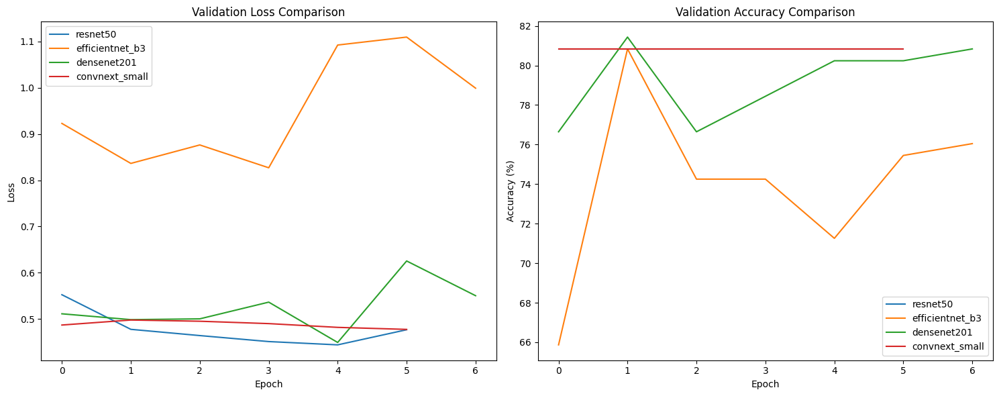

In [ ]:
import matplotlib.pyplot as plt

# ========================
# MODEL COMPARISON VISUALIZATION
# ========================
plt.figure(figsize=(15, 6))

# Loss Comparison
plt.subplot(1, 2, 1)
for model_name, metrics in all_metrics.items():
    plt.plot(metrics['val_loss'], label=model_name)
plt.title('Validation Loss Comparison')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Accuracy Comparison
plt.subplot(1, 2, 2)
for model_name, metrics in all_metrics.items():
    plt.plot(metrics['val_acc'], label=model_name)
plt.title('Validation Accuracy Comparison')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.legend()

plt.tight_layout()
plt.show()


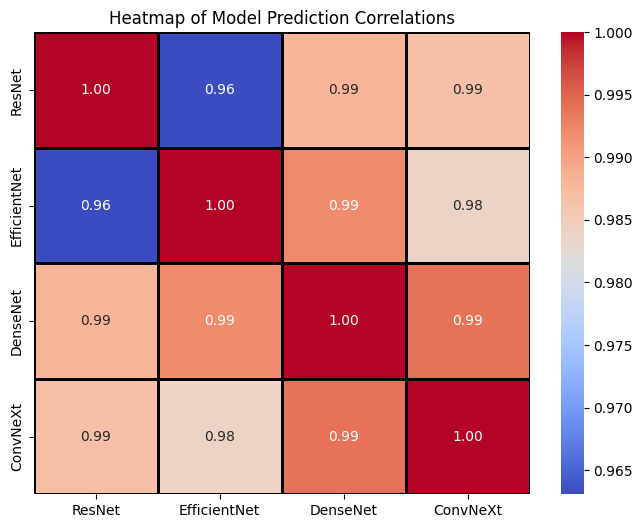

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Convert model probabilities into a DataFrame
heatmap_data = pd.DataFrame({
    "ResNet": models["ResNet"]["pred_probs"],
    "EfficientNet": models["EfficientNet"]["pred_probs"],
    "DenseNet": models["DenseNet"]["pred_probs"],
    "ConvNeXt": models["ConvNeXt"]["pred_probs"]
})

# Compute correlation matrix
correlation_matrix = heatmap_data.corr()

# Create the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=1, linecolor='black')

# Labels
plt.title("Heatmap of Model Prediction Correlations")
plt.show()


<ipython-input-61-61ff51bd9d5e>:35: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=DEVICE))



Classification Report - resnet50

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        32
           1       0.81      1.00      0.89       135

    accuracy                           0.81       167
   macro avg       0.40      0.50      0.45       167
weighted avg       0.65      0.81      0.72       167



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


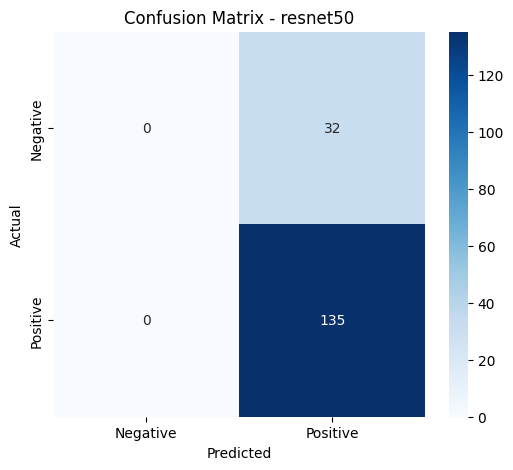

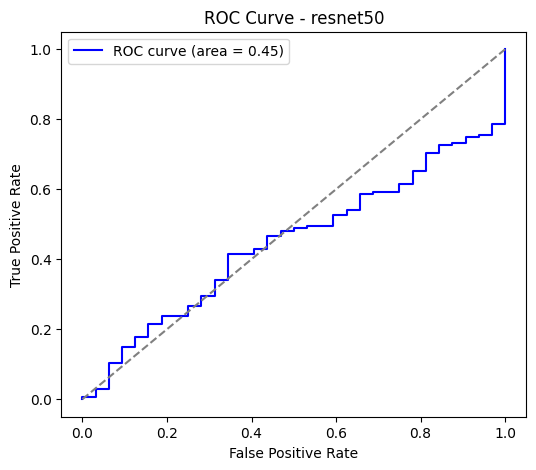

<ipython-input-61-61ff51bd9d5e>:35: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=DEVICE))



Classification Report - efficientnet_b3

              precision    recall  f1-score   support

           0       0.44      0.12      0.20        32
           1       0.82      0.96      0.89       135

    accuracy                           0.80       167
   macro avg       0.63      0.54      0.54       167
weighted avg       0.75      0.80      0.75       167



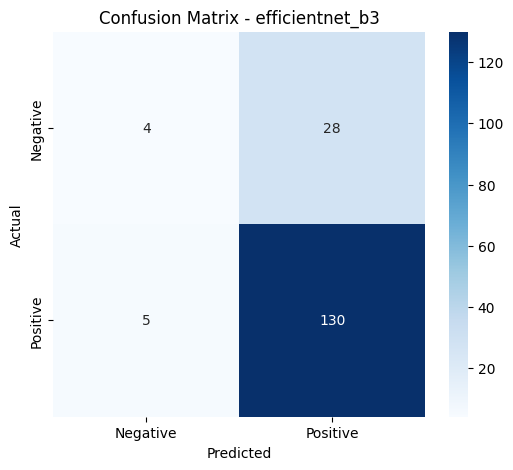

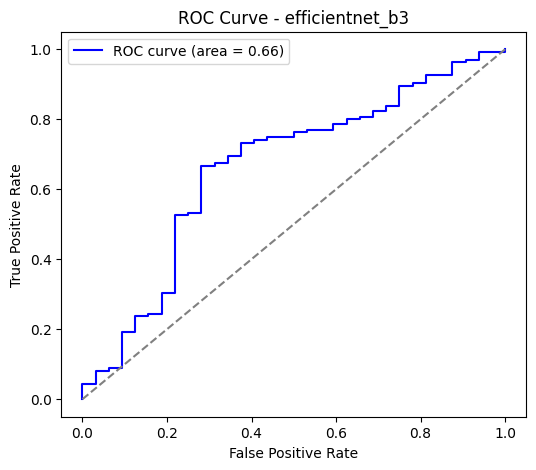

<ipython-input-61-61ff51bd9d5e>:35: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=DEVICE))



Classification Report - densenet201

              precision    recall  f1-score   support

           0       0.56      0.16      0.24        32
           1       0.83      0.97      0.89       135

    accuracy                           0.81       167
   macro avg       0.69      0.56      0.57       167
weighted avg       0.78      0.81      0.77       167



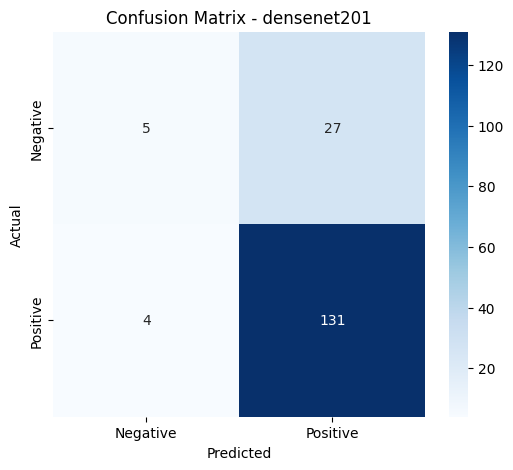

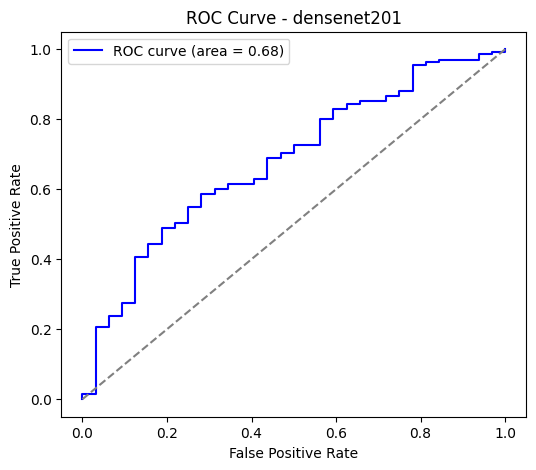

<ipython-input-61-61ff51bd9d5e>:35: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=DEVICE))



Classification Report - convnext_small

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        32
           1       0.81      1.00      0.89       135

    accuracy                           0.81       167
   macro avg       0.40      0.50      0.45       167
weighted avg       0.65      0.81      0.72       167



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


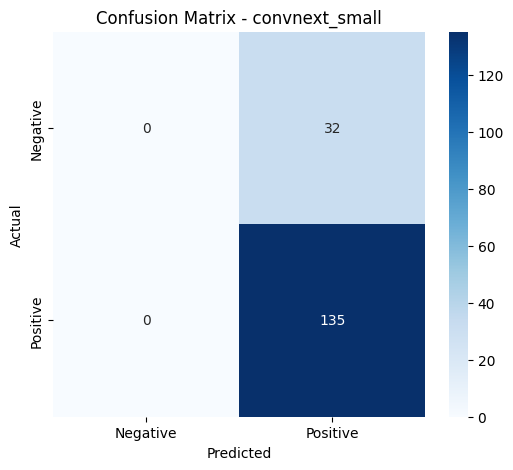

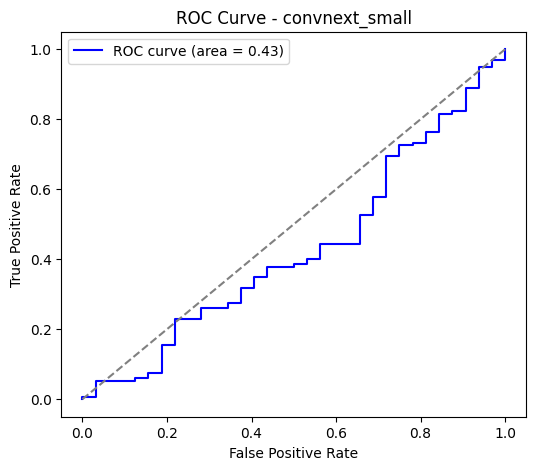

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc

def plot_confusion_matrix(y_true, y_pred, model_name):
    """Plot confusion matrix."""
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix - {model_name}')
    plt.show()

def plot_roc_curve(y_true, y_prob, model_name):
    """Plot ROC curve."""
    fpr, tpr, _ = roc_curve(y_true, y_prob)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(6, 5))
    plt.plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {model_name}')
    plt.legend()
    plt.show()

# =========================
# LOAD BEST MODEL AND EVALUATE
# =========================
def evaluate_model(model_path, model_name):
    """Evaluate the saved best model."""
    model = timm.create_model(model_name, pretrained=False, num_classes=2)
    model.load_state_dict(torch.load(model_path, map_location=DEVICE))
    model.to(DEVICE)
    model.eval()

    y_true = []
    y_pred = []
    y_prob = []

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(DEVICE), labels.to(DEVICE)
            outputs = model(images)
            probabilities = torch.nn.functional.softmax(outputs, dim=1)[:, 1]  # Probabilities for positive class
            _, predictions = torch.max(outputs, 1)

            y_true.extend(labels.cpu().numpy())
            y_pred.extend(predictions.cpu().numpy())
            y_prob.extend(probabilities.cpu().numpy())

    print(f"\nClassification Report - {model_name}\n")
    print(classification_report(y_true, y_pred))

    plot_confusion_matrix(y_true, y_pred, model_name)
    plot_roc_curve(y_true, y_prob, model_name)

# =========================
# EVALUATE ALL MODELS
# =========================
for model_name in MODELS:
    model_path = f"best_{model_name}.pth"
    evaluate_model(model_path, model_name)


/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


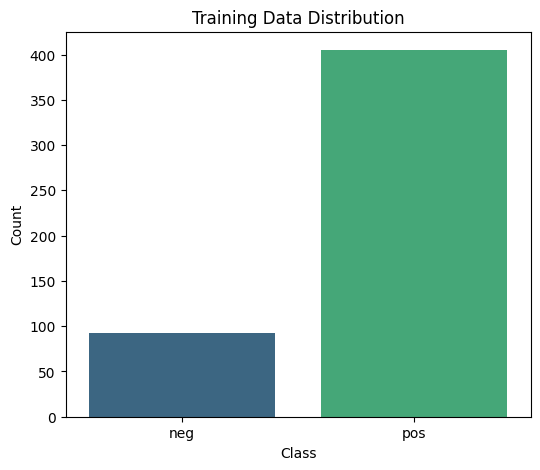

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


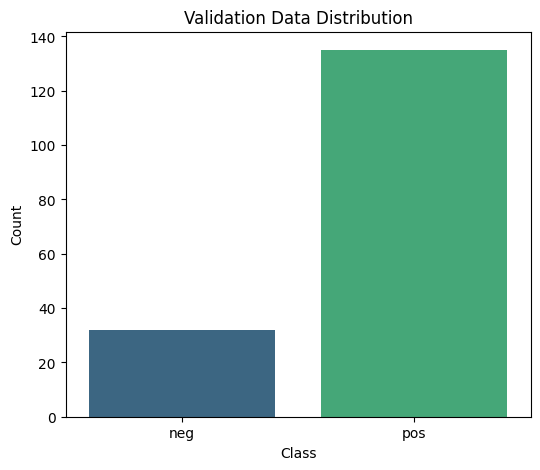

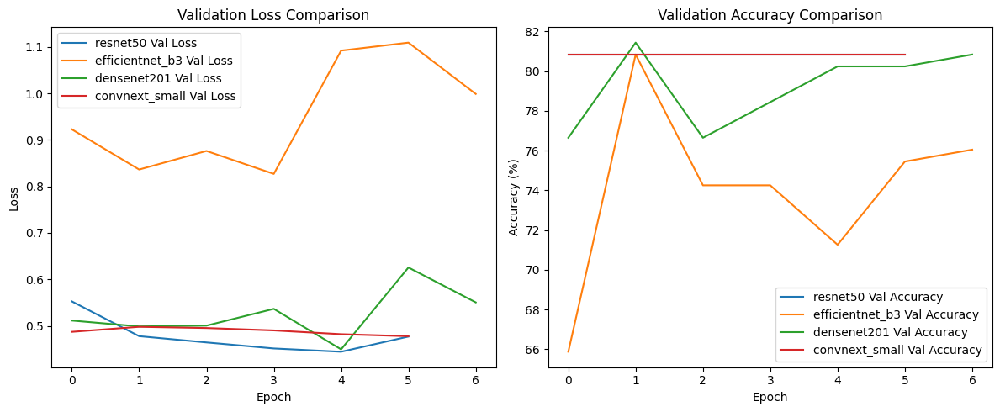

<ipython-input-63-c8f0f3b87b58>:128: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=DEVICE))



Classification Report for resnet50:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        32
           1       0.81      1.00      0.89       135

    accuracy                           0.81       167
   macro avg       0.40      0.50      0.45       167
weighted avg       0.65      0.81      0.72       167



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


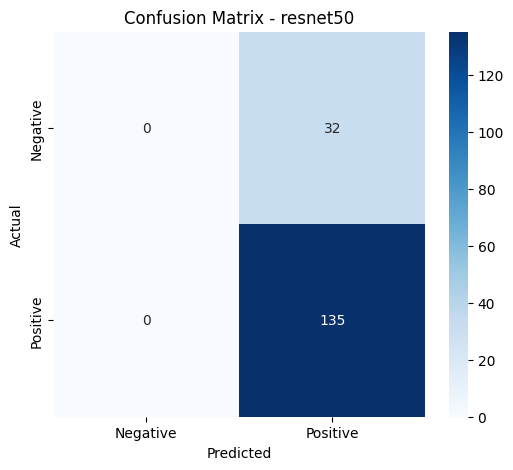

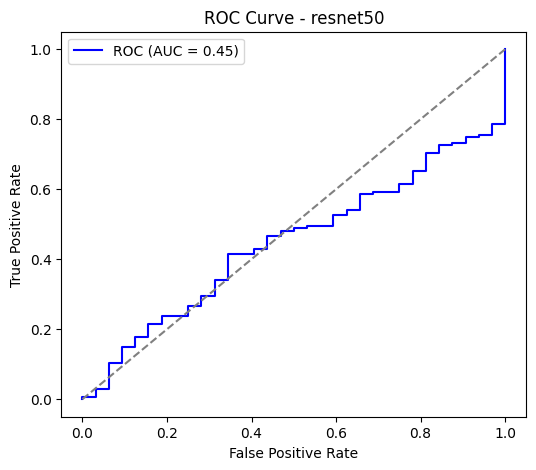

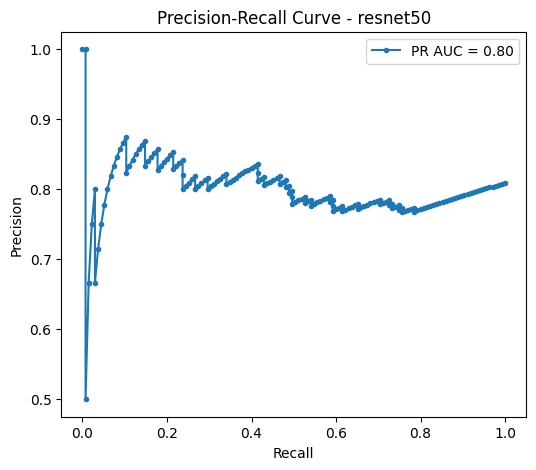

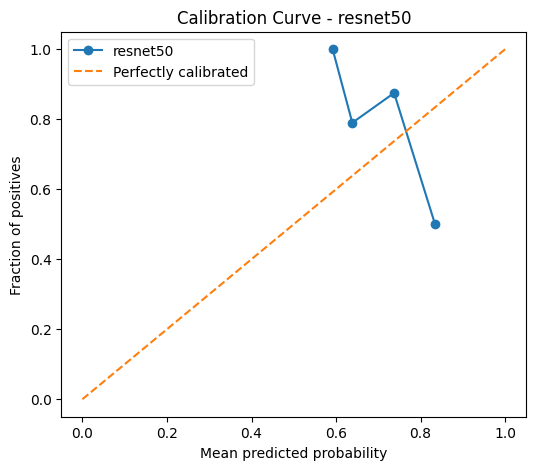

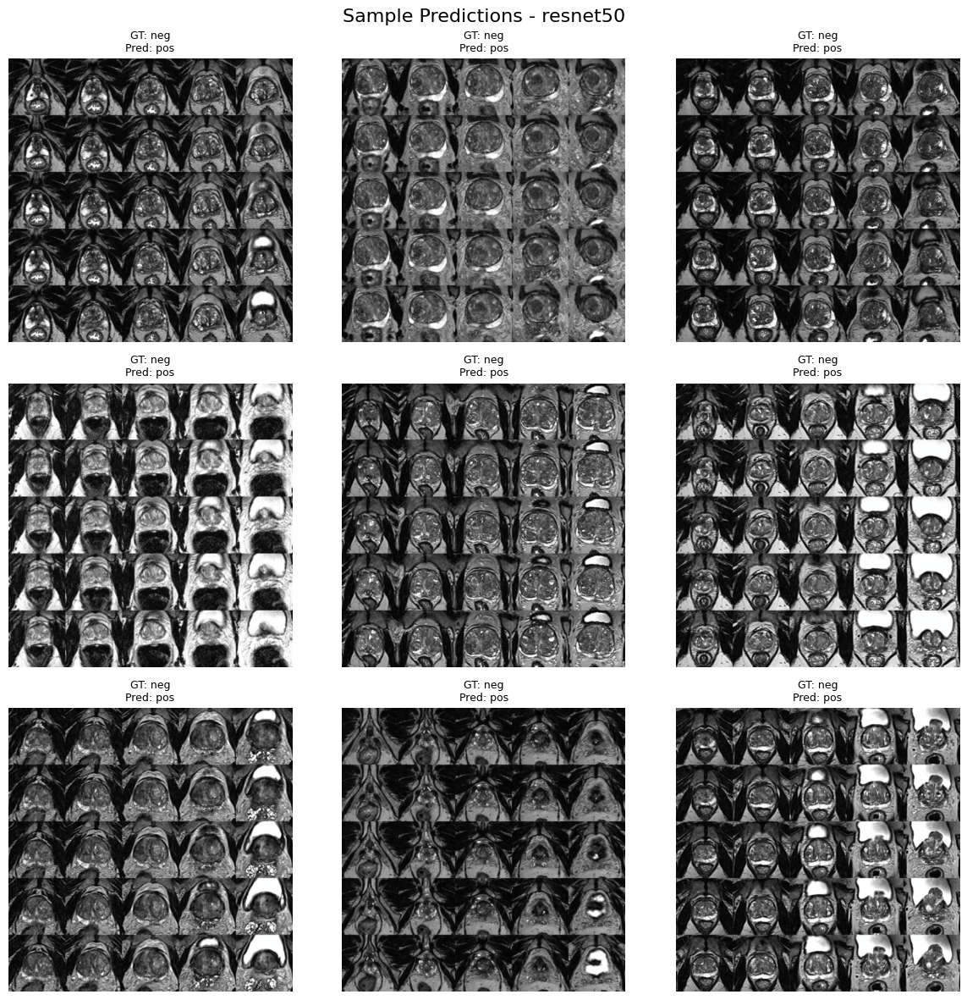

<ipython-input-63-c8f0f3b87b58>:128: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=DEVICE))



Classification Report for efficientnet_b3:
              precision    recall  f1-score   support

           0       0.44      0.12      0.20        32
           1       0.82      0.96      0.89       135

    accuracy                           0.80       167
   macro avg       0.63      0.54      0.54       167
weighted avg       0.75      0.80      0.75       167



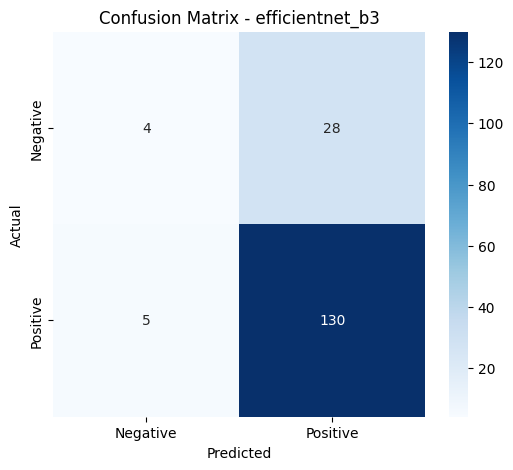

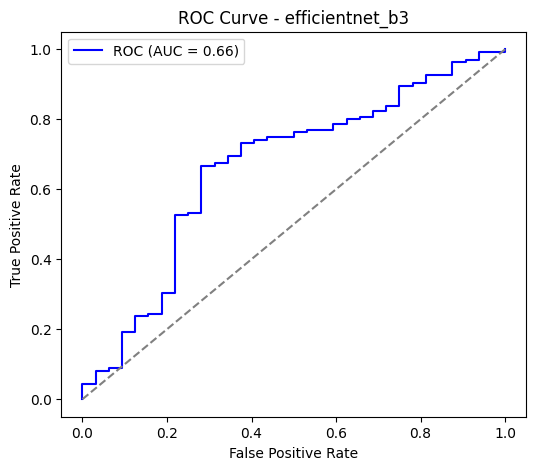

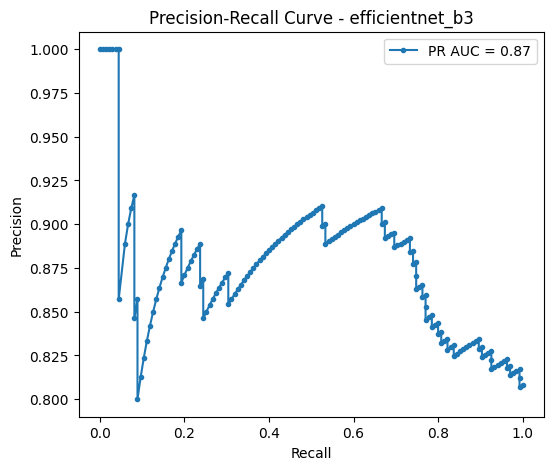

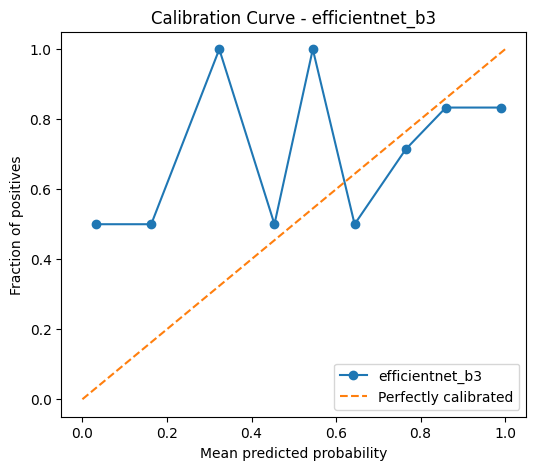

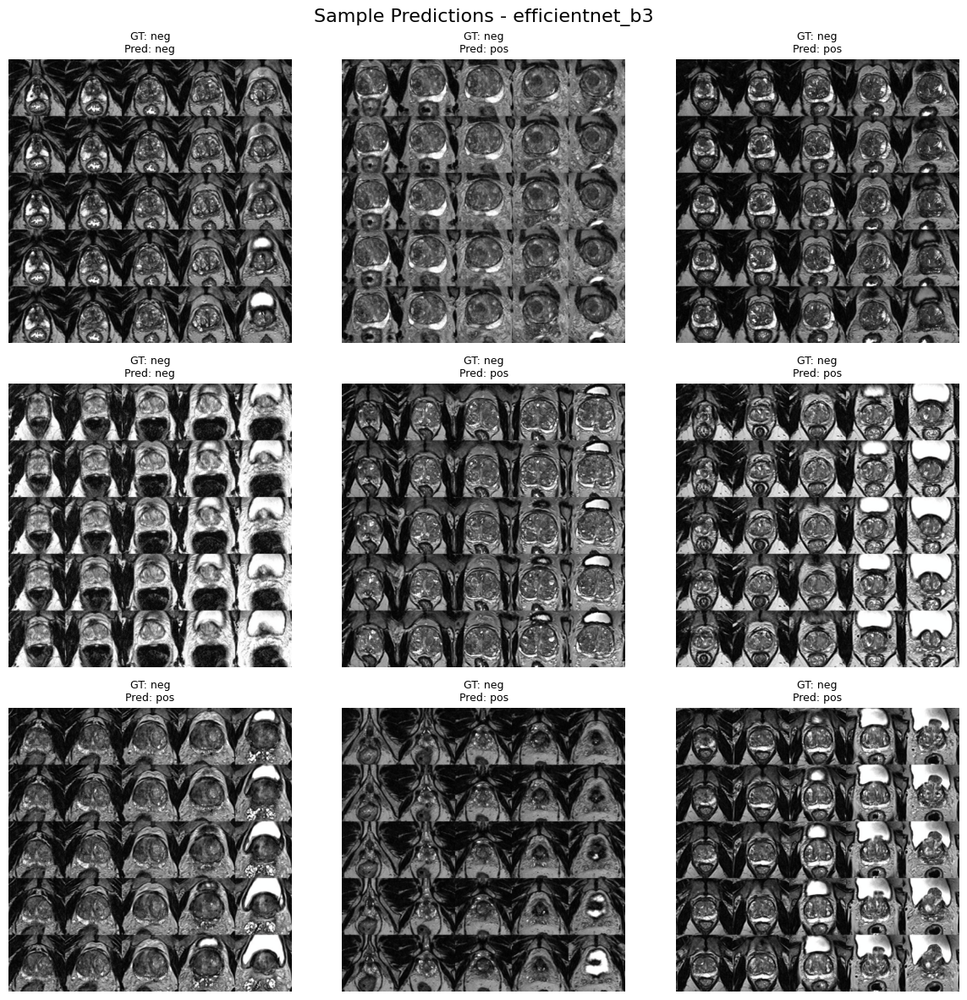

<ipython-input-63-c8f0f3b87b58>:128: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=DEVICE))



Classification Report for densenet201:
              precision    recall  f1-score   support

           0       0.56      0.16      0.24        32
           1       0.83      0.97      0.89       135

    accuracy                           0.81       167
   macro avg       0.69      0.56      0.57       167
weighted avg       0.78      0.81      0.77       167



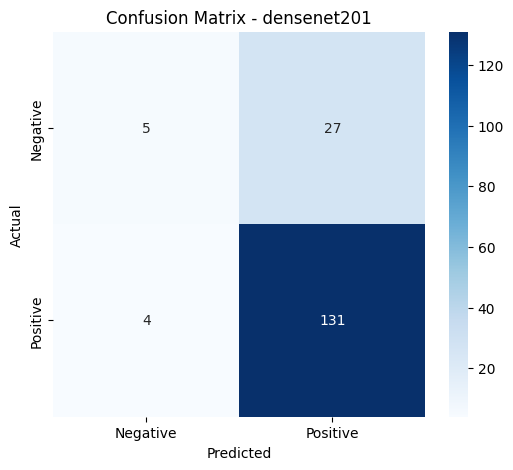

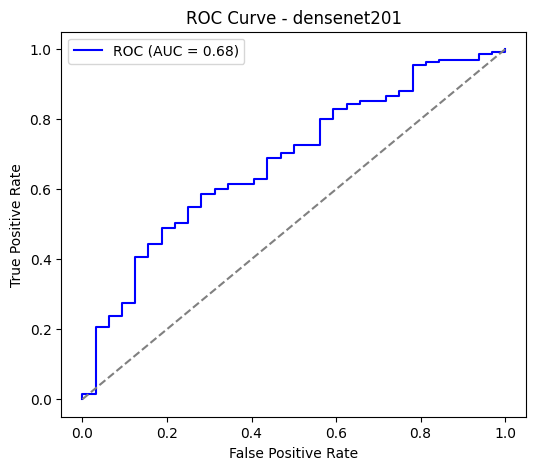

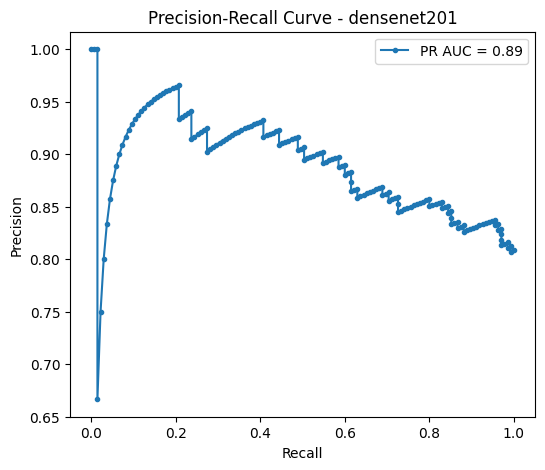

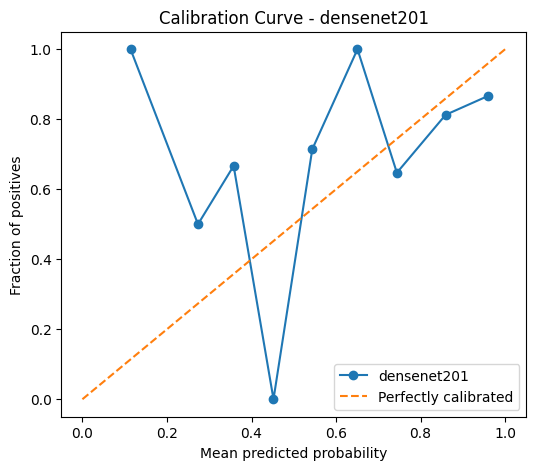

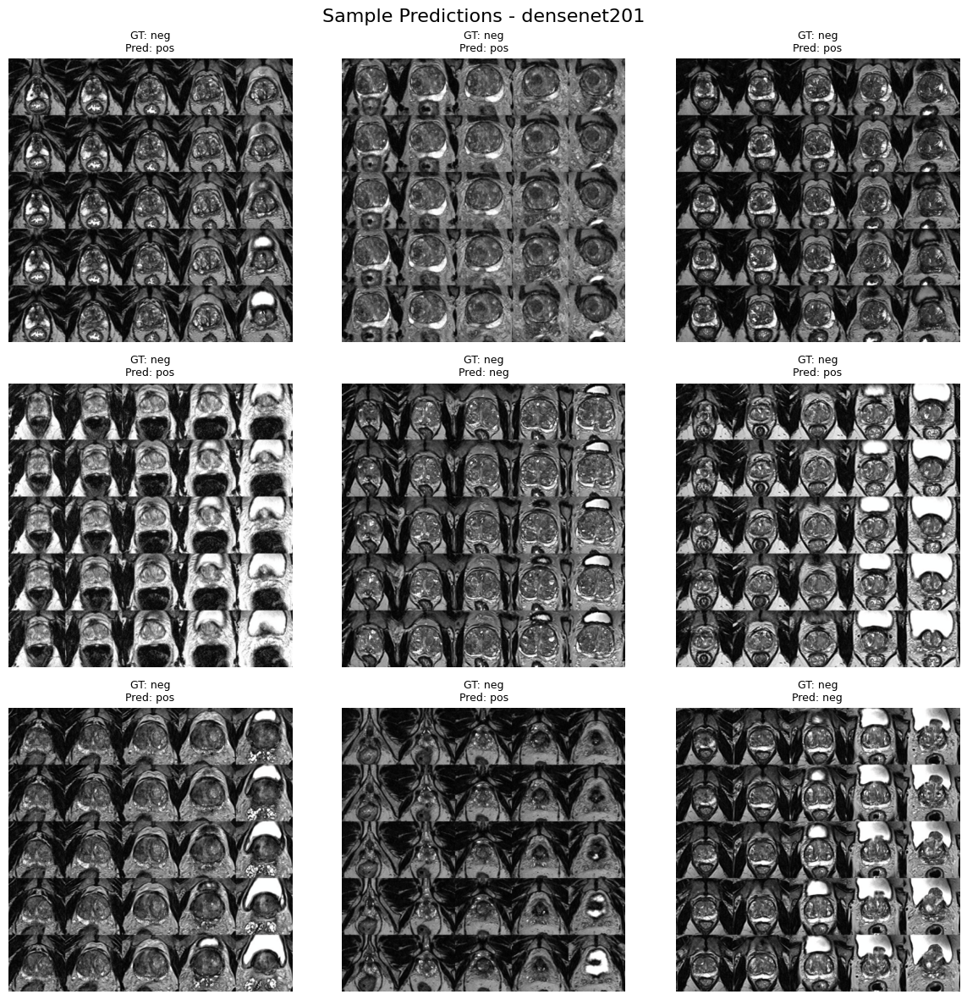

<ipython-input-63-c8f0f3b87b58>:128: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=DEVICE))



Classification Report for convnext_small:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        32
           1       0.81      1.00      0.89       135

    accuracy                           0.81       167
   macro avg       0.40      0.50      0.45       167
weighted avg       0.65      0.81      0.72       167



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


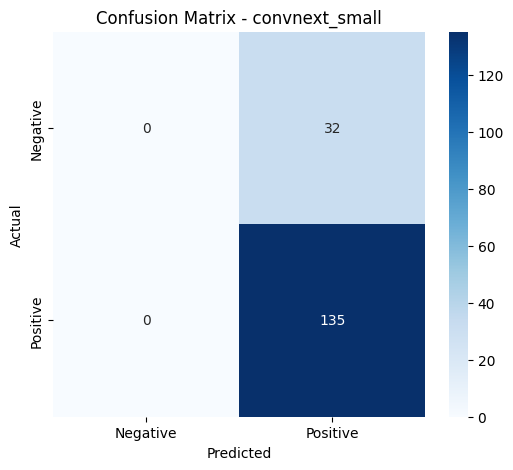

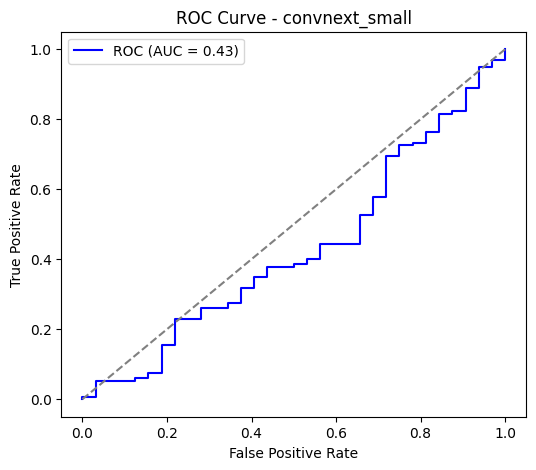

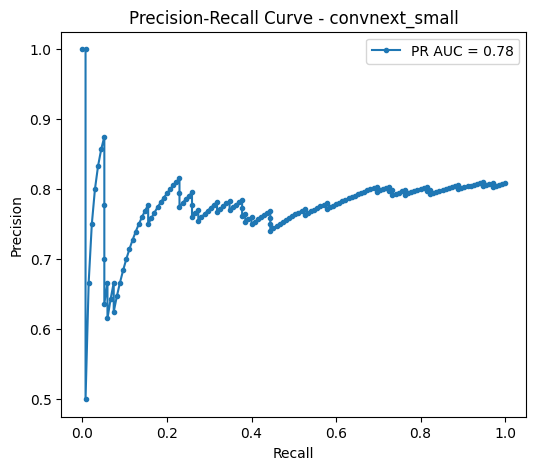

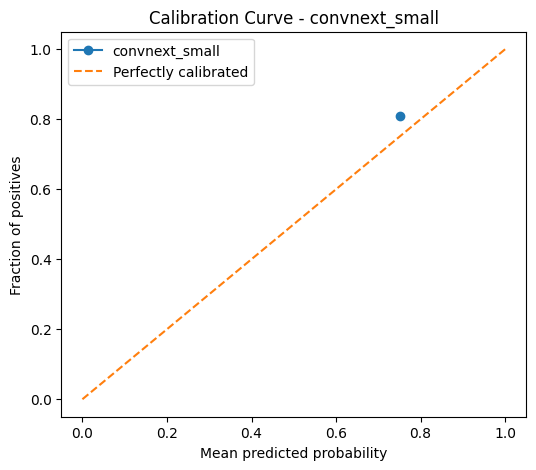

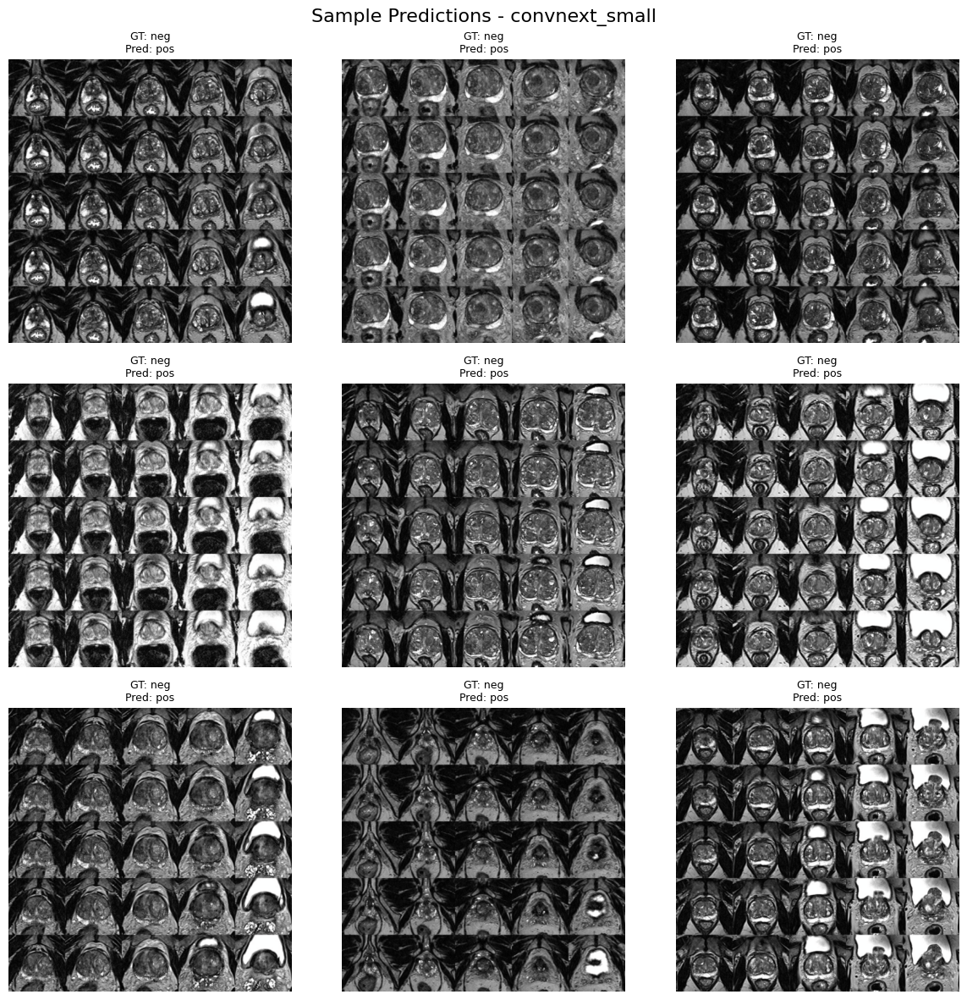

<ipython-input-63-c8f0f3b87b58>:195: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(f"best_{model_name}.pth", map_location=DEVICE))
<ipython-


Ensemble Classification Report:
              precision    recall  f1-score   support

           0       0.50      0.03      0.06        32
           1       0.81      0.99      0.89       135

    accuracy                           0.81       167
   macro avg       0.66      0.51      0.48       167
weighted avg       0.75      0.81      0.73       167



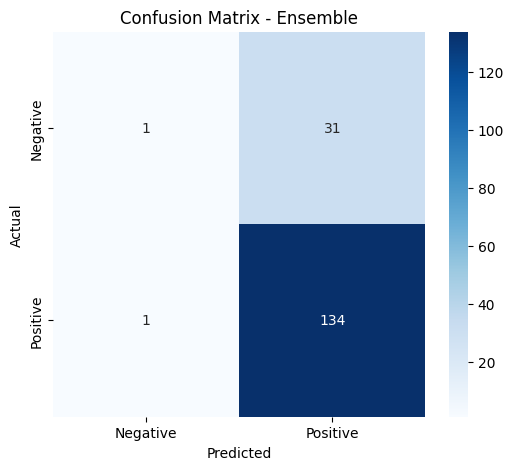

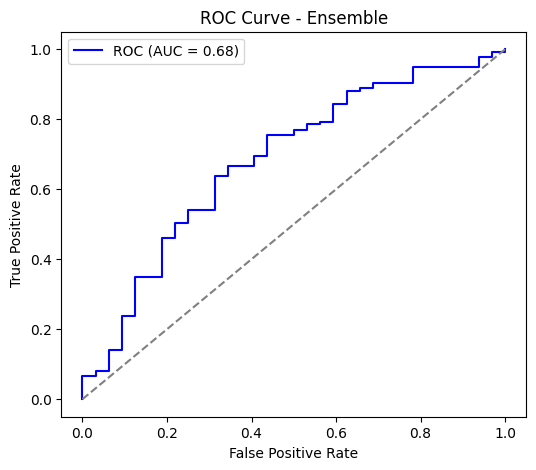

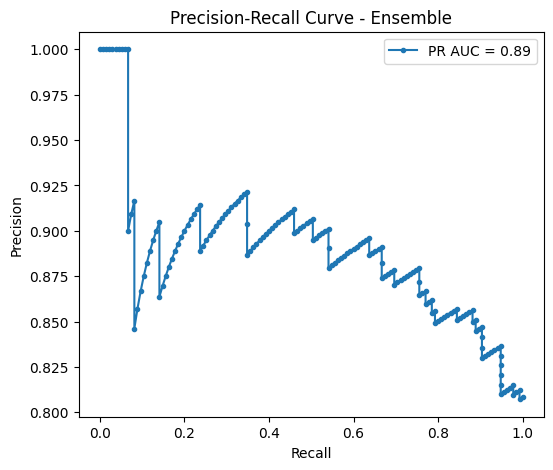

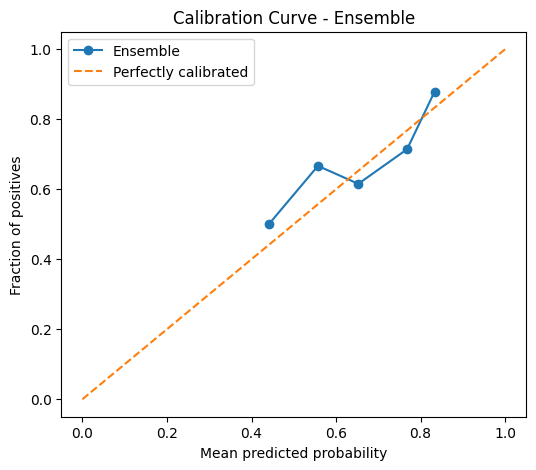

<ipython-input-63-c8f0f3b87b58>:260: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


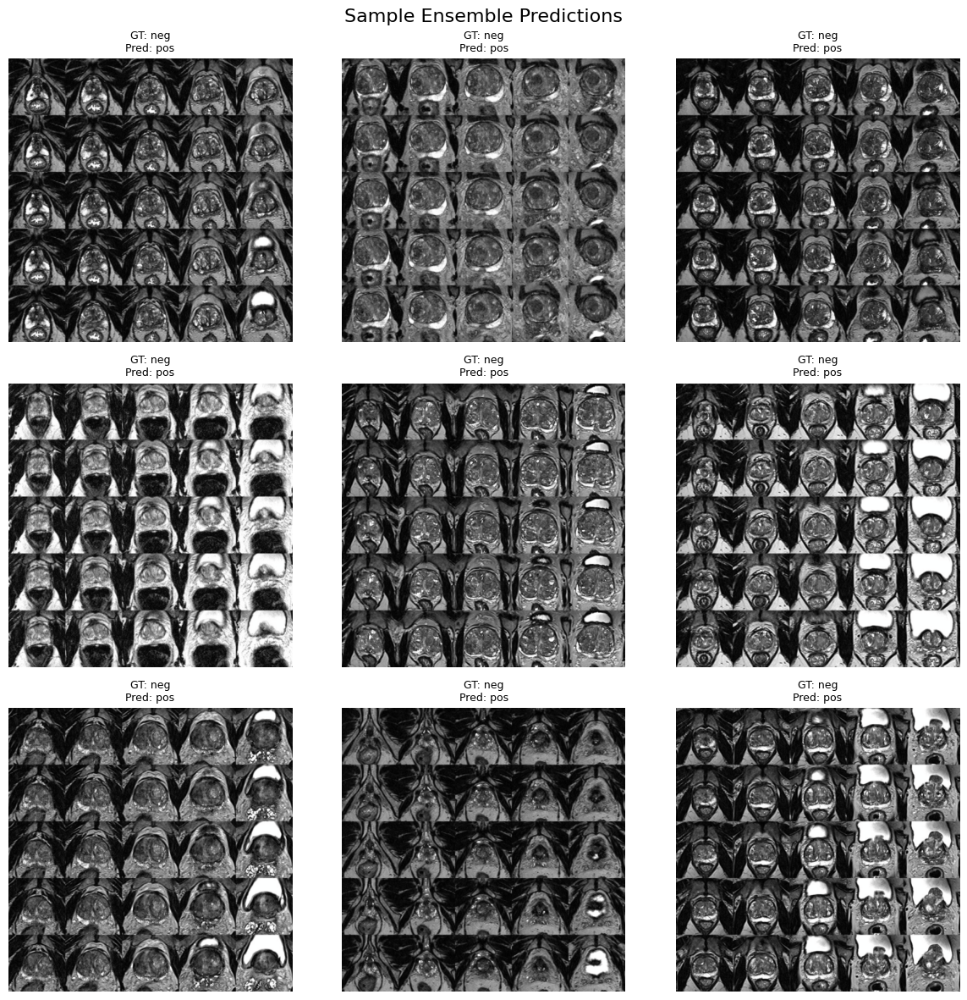

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (classification_report, confusion_matrix, roc_curve, auc,
                             precision_recall_curve)
from sklearn.calibration import calibration_curve
import torch
import torch.nn as nn
import timm

# Assuming these variables are already defined in your environment:
#   DEVICE, NUM_CLASSES, IMG_SIZE, MODELS, val_loader, train_dataset, val_dataset, all_metrics

###############################
# 1. DATA DISTRIBUTION VISUALIZATION
###############################
def plot_data_distribution(dataset, title):
    # Get labels and count them
    labels = [label for _, label in dataset.imgs]
    classes = dataset.classes
    counts = [labels.count(i) for i in range(len(classes))]

    plt.figure(figsize=(6,5))
    sns.barplot(x=classes, y=counts, palette="viridis")
    plt.title(title)
    plt.ylabel('Count')
    plt.xlabel('Class')
    plt.show()

# Plot distribution for training and validation datasets
plot_data_distribution(train_dataset, "Training Data Distribution")
plot_data_distribution(val_dataset, "Validation Data Distribution")

###############################
# 2. TRAINING CURVES COMPARISON
###############################
# Plot validation loss and accuracy for all models (if stored in all_metrics)
plt.figure(figsize=(12, 5))

# Loss Comparison
plt.subplot(1, 2, 1)
for model_name, metrics in all_metrics.items():
    plt.plot(metrics['val_loss'], label=f'{model_name} Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Validation Loss Comparison')
plt.legend()

# Accuracy Comparison
plt.subplot(1, 2, 2)
for model_name, metrics in all_metrics.items():
    plt.plot(metrics['val_acc'], label=f'{model_name} Val Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.title('Validation Accuracy Comparison')
plt.legend()

plt.tight_layout()
plt.show()

###############################
# 3. INDIVIDUAL MODEL EVALUATION & VISUALIZATION
###############################
def plot_confusion_matrix(y_true, y_pred, model_name):
    """Plot confusion matrix."""
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6,5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=['Negative','Positive'], yticklabels=['Negative','Positive'])
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix - {model_name}')
    plt.show()

def plot_roc_curve(y_true, y_prob, model_name):
    """Plot ROC curve."""
    fpr, tpr, _ = roc_curve(y_true, y_prob)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(6,5))
    plt.plot(fpr, tpr, color='blue', label=f'ROC (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {model_name}')
    plt.legend()
    plt.show()

def visualize_sample_predictions(model, model_name, loader, num_images=9):
    """Display a grid of sample images with ground truth and predicted labels."""
    model.eval()
    images_shown = 0
    fig, axes = plt.subplots(int(np.sqrt(num_images)), int(np.sqrt(num_images)), figsize=(12,12))
    axes = axes.flatten()
    class_names = val_dataset.classes

    with torch.no_grad():
        for images, labels in loader:
            images = images.to(DEVICE)
            outputs = model(images)
            _, predictions = torch.max(outputs, 1)
            for i in range(images.size(0)):
                if images_shown >= num_images:
                    break
                img = images[i].cpu().permute(1,2,0).numpy()
                # Denormalize the image using the same parameters used in transforms.Normalize
                mean = np.array([0.485, 0.456, 0.406])
                std = np.array([0.229, 0.224, 0.225])
                img = std * img + mean
                img = np.clip(img, 0, 1)
                axes[images_shown].imshow(img)
                axes[images_shown].axis('off')
                axes[images_shown].set_title(f"GT: {class_names[labels[i]]}\nPred: {class_names[predictions[i]]}", fontsize=9)
                images_shown += 1
            if images_shown >= num_images:
                break
    plt.suptitle(f"Sample Predictions - {model_name}", fontsize=16)
    plt.tight_layout()
    plt.show()

def evaluate_and_visualize_model(model_path, model_name, loader):
    """Load a saved model, compute predictions, and generate various evaluation plots."""
    # Load the model
    model = timm.create_model(model_name, pretrained=False, num_classes=NUM_CLASSES)
    if torch.cuda.device_count() > 1:
        model = nn.DataParallel(model)
    model.load_state_dict(torch.load(model_path, map_location=DEVICE))
    model.to(DEVICE)
    model.eval()

    y_true = []
    y_pred = []
    y_prob = []

    with torch.no_grad():
        for images, labels in loader:
            images = images.to(DEVICE)
            outputs = model(images)
            probabilities = torch.nn.functional.softmax(outputs, dim=1)[:, 1]  # positive class probability
            _, predictions = torch.max(outputs, 1)

            y_true.extend(labels.cpu().numpy())
            y_pred.extend(predictions.cpu().numpy())
            y_prob.extend(probabilities.cpu().numpy())

    # Print classification report
    print(f"\nClassification Report for {model_name}:")
    print(classification_report(y_true, y_pred))

    # Plot Confusion Matrix, ROC, and additional curves
    plot_confusion_matrix(y_true, y_pred, model_name)
    plot_roc_curve(y_true, y_prob, model_name)

    # Precision-Recall Curve
    precision, recall, _ = precision_recall_curve(y_true, y_prob)
    pr_auc = auc(recall, precision)
    plt.figure(figsize=(6,5))
    plt.plot(recall, precision, marker='.', label=f'PR AUC = {pr_auc:.2f}')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall Curve - {model_name}')
    plt.legend()
    plt.show()

    # Calibration Curve
    prob_true, prob_pred = calibration_curve(y_true, y_prob, n_bins=10)
    plt.figure(figsize=(6,5))
    plt.plot(prob_pred, prob_true, marker='o', label=model_name)
    plt.plot([0,1], [0,1], linestyle='--', label='Perfectly calibrated')
    plt.xlabel('Mean predicted probability')
    plt.ylabel('Fraction of positives')
    plt.title(f'Calibration Curve - {model_name}')
    plt.legend()
    plt.show()

    # Visualize sample predictions
    visualize_sample_predictions(model, model_name, loader, num_images=9)

# Evaluate and visualize each individual model
for model_name in MODELS:
    model_path = f"best_{model_name}.pth"
    evaluate_and_visualize_model(model_path, model_name, val_loader)

###############################
# 4. ENSEMBLE EVALUATION & VISUALIZATION
###############################
# Assume you have already loaded each model into a list "loaded_models" as in your training code.
# If not, load them as follows:
loaded_models = []
for model_name in MODELS:
    model = timm.create_model(model_name, pretrained=False, num_classes=NUM_CLASSES)
    if torch.cuda.device_count() > 1:
        model = nn.DataParallel(model)
    model.load_state_dict(torch.load(f"best_{model_name}.pth", map_location=DEVICE))
    model.to(DEVICE)
    model.eval()
    loaded_models.append(model)

def evaluate_ensemble(loader, models):
    y_true = []
    y_pred = []
    y_prob = []

    with torch.no_grad():
        for images, labels in loader:
            images = images.to(DEVICE)
            outputs = []
            for model in models:
                with torch.cuda.amp.autocast():
                    out = model(images).softmax(dim=1)[:, 1]
                outputs.append(out.cpu().numpy())
            avg_output = np.mean(outputs, axis=0)
            preds = (avg_output > 0.5).astype(int)
            y_true.extend(labels.cpu().numpy())
            y_pred.extend(preds)
            y_prob.extend(avg_output)

    # Classification report
    print("\nEnsemble Classification Report:")
    print(classification_report(y_true, y_pred))

    # Ensemble Evaluation Plots
    plot_confusion_matrix(y_true, y_pred, "Ensemble")
    plot_roc_curve(y_true, y_prob, "Ensemble")

    precision, recall, _ = precision_recall_curve(y_true, y_prob)
    pr_auc = auc(recall, precision)
    plt.figure(figsize=(6,5))
    plt.plot(recall, precision, marker='.', label=f'PR AUC = {pr_auc:.2f}')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve - Ensemble')
    plt.legend()
    plt.show()

    prob_true, prob_pred = calibration_curve(y_true, y_prob, n_bins=10)
    plt.figure(figsize=(6,5))
    plt.plot(prob_pred, prob_true, marker='o', label='Ensemble')
    plt.plot([0,1], [0,1], linestyle='--', label='Perfectly calibrated')
    plt.xlabel('Mean predicted probability')
    plt.ylabel('Fraction of positives')
    plt.title('Calibration Curve - Ensemble')
    plt.legend()
    plt.show()

    # Visualize sample ensemble predictions
    visualize_ensemble_sample_predictions(models, loader, num_images=9)

def visualize_ensemble_sample_predictions(models, loader, num_images=9):
    fig, axes = plt.subplots(int(np.sqrt(num_images)), int(np.sqrt(num_images)), figsize=(12,12))
    axes = axes.flatten()
    class_names = val_dataset.classes
    images_shown = 0
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(DEVICE)
            outputs = []
            for model in models:
                with torch.cuda.amp.autocast():
                    out = model(images).softmax(dim=1)[:, 1]
                outputs.append(out.cpu().numpy())
            avg_output = np.mean(outputs, axis=0)
            preds = (avg_output > 0.5).astype(int)
            for i in range(images.size(0)):
                if images_shown >= num_images:
                    break
                img = images[i].cpu().permute(1,2,0).numpy()
                mean = np.array([0.485, 0.456, 0.406])
                std = np.array([0.229, 0.224, 0.225])
                img = std * img + mean
                img = np.clip(img, 0, 1)
                axes[images_shown].imshow(img)
                axes[images_shown].axis('off')
                axes[images_shown].set_title(f"GT: {class_names[labels[i]]}\nPred: {class_names[preds[i]]}", fontsize=9)
                images_shown += 1
            if images_shown >= num_images:
                break
    plt.suptitle("Sample Ensemble Predictions", fontsize=16)
    plt.tight_layout()
    plt.show()

# Run ensemble evaluation and visualization
evaluate_ensemble(val_loader, loaded_models)
